# “Scoring crédit” 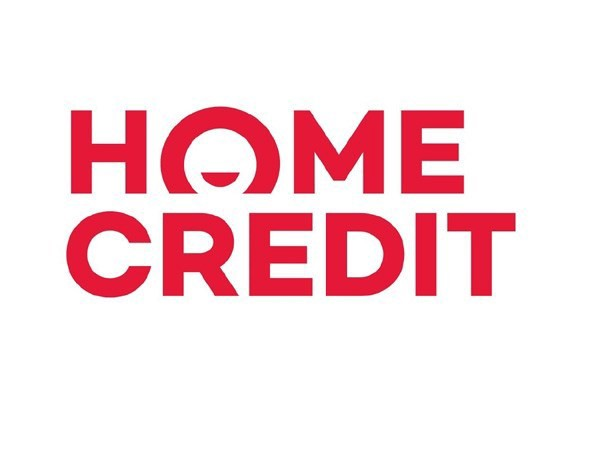

In [4]:
import pandas as pd
import os.path as path
import csv
import pandas as pd
import numpy as np
import missingno as msno 
import matplotlib.pyplot as plt
import scipy.stats as stats 
import seaborn as sns
import plotly.express as px
from sklearn.impute import KNNImputer
from sklearn.impute import MissingIndicator
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import f_oneway
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.metrics import roc_curve
from sklearn.metrics import auc



# Step 1. Understand the business problem (and define success)

# Diagram showing how all of the data is related: 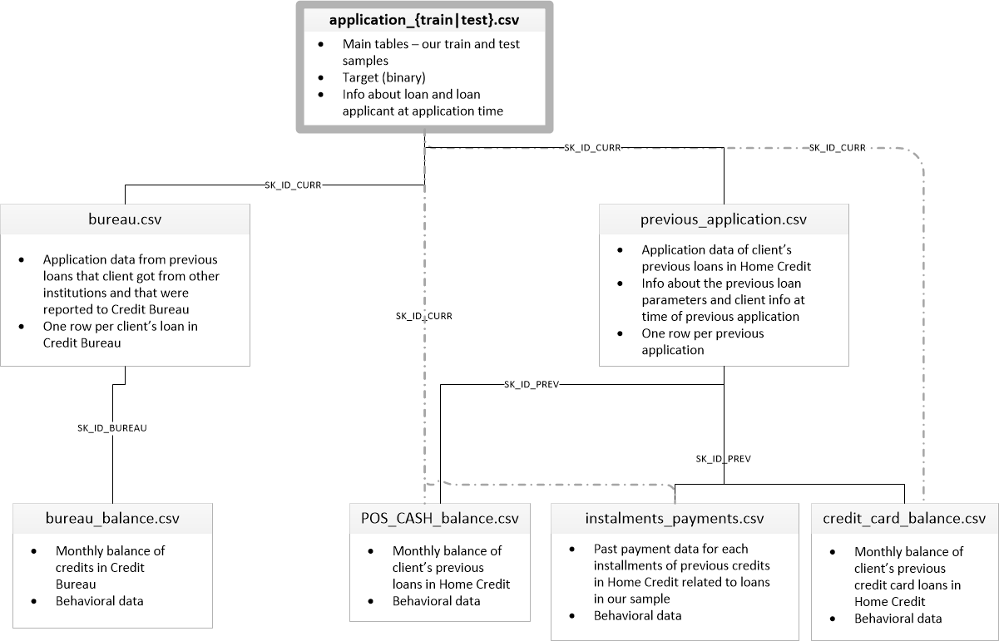

# Step 2 to build a machine learning Model Understand and identify data

In [1]:
import os
import glob
from pathlib import Path
from zipfile import ZipFile
#folder_location = 'C:\Users\NADEL\Downloads'
#directory = "Project4"
zipFilesName = "Projet+Mise+en+prod+-+home-credit-default-risk.zip"
directory = "HomeCredit"
def zipFileManagement(files):
        with ZipFile(files, 'r') as zip:
                zip.printdir()
                zip.extractall('Credit_to_spend')
                print(list)
                path_to_target = './Users/NADEL/HomeCredit/Credit_to_spend'
                path_to_file_list = glob.glob(path_to_target + '*csv' )
                file_list = [i.split('/')[-1] for i in path_to_file_list]
                print(file_list)
zipFileManagement(zipFilesName)

File Name                                             Modified             Size
installments_payments.csv                      2018-06-26 05:05:32    723118349
credit_card_balance.csv                        2018-06-26 05:04:26    424582605
bureau.csv                                     2018-06-26 05:04:58    170016717
POS_CASH_balance.csv                           2018-06-26 05:04:52    392703158
sample_submission.csv                          2018-06-26 05:05:32       536202
application_train.csv                          2018-06-26 05:05:48    166133370
HomeCredit_columns_description.csv             2018-06-26 05:04:04        37383
previous_application.csv                       2018-06-26 05:05:42    404973293
bureau_balance.csv                             2018-06-26 05:04:38    375592889
application_test.csv                           2018-06-26 05:04:54     26567651
<class 'list'>
[]


### Les données recuperees nous pouvons commencer notre EDA Analyse

In [5]:
application_test = pd.read_csv('Credit_to_spend/application_test.csv')
application_train = pd.read_csv('Credit_to_spend/application_train.csv')

application_train.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.0,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.0,405000.0,20250.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
application_test.info

<bound method DataFrame.info of        SK_ID_CURR NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR FLAG_OWN_REALTY  \
0          100001         Cash loans           F            N               Y   
1          100005         Cash loans           M            N               Y   
2          100013         Cash loans           M            Y               Y   
3          100028         Cash loans           F            N               Y   
4          100038         Cash loans           M            Y               N   
...           ...                ...         ...          ...             ...   
48739      456221         Cash loans           F            N               Y   
48740      456222         Cash loans           F            N               N   
48741      456223         Cash loans           F            Y               Y   
48742      456224         Cash loans           M            N               N   
48743      456250         Cash loans           F            Y               N

In [5]:
application_test.info(verbose=True, null_counts=True)

C:\Users\nadia\AppData\Local\Temp\ipykernel_16900\2224951114.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  application_test.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 121 columns):
 #    Column                        Non-Null Count  Dtype  
---   ------                        --------------  -----  
 0    SK_ID_CURR                    48744 non-null  int64  
 1    NAME_CONTRACT_TYPE            48744 non-null  object 
 2    CODE_GENDER                   48744 non-null  object 
 3    FLAG_OWN_CAR                  48744 non-null  object 
 4    FLAG_OWN_REALTY               48744 non-null  object 
 5    CNT_CHILDREN                  48744 non-null  int64  
 6    AMT_INCOME_TOTAL              48744 non-null  float64
 7    AMT_CREDIT                    48744 non-null  float64
 8    AMT_ANNUITY                   48720 non-null  float64
 9    AMT_GOODS_PRICE               48744 non-null  float64
 10   NAME_TYPE_SUITE               47833 non-null  object 
 11   NAME_INCOME_TYPE              48744 non-null  object 
 12   NAME_EDUCATION_TYPE           48744 non-null

In [6]:
application_test.dtypes.value_counts()

float64    65
int64      40
object     16
dtype: int64

In [7]:
application_test.isna().any()

SK_ID_CURR                    False
NAME_CONTRACT_TYPE            False
CODE_GENDER                   False
FLAG_OWN_CAR                  False
FLAG_OWN_REALTY               False
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY      True
AMT_REQ_CREDIT_BUREAU_WEEK     True
AMT_REQ_CREDIT_BUREAU_MON      True
AMT_REQ_CREDIT_BUREAU_QRT      True
AMT_REQ_CREDIT_BUREAU_YEAR     True
Length: 121, dtype: bool

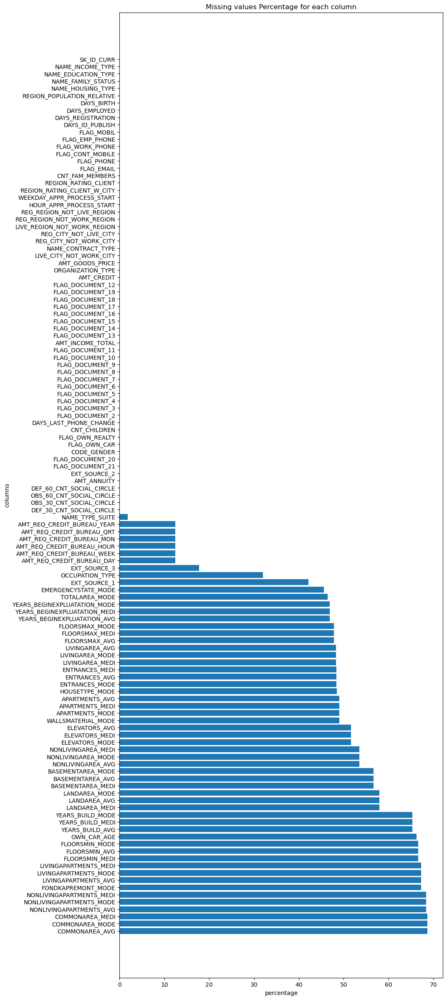

In [8]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(application_test)


In [9]:
application_test.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [10]:
application_test.select_dtypes('float64').apply(pd.Series.nunique,axis = 0)

AMT_INCOME_TOTAL               606
AMT_CREDIT                    2937
AMT_ANNUITY                   7491
AMT_GOODS_PRICE                677
REGION_POPULATION_RELATIVE      81
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY        3
AMT_REQ_CREDIT_BUREAU_WEEK       3
AMT_REQ_CREDIT_BUREAU_MON        7
AMT_REQ_CREDIT_BUREAU_QRT        8
AMT_REQ_CREDIT_BUREAU_YEAR      16
Length: 65, dtype: int64

In [11]:
application_test.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    2
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               7
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             5
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

In [12]:
application_test.select_dtypes('int64').apply(pd.Series.nunique, axis = 0)

SK_ID_CURR                     48744
CNT_CHILDREN                      11
DAYS_BIRTH                     15477
DAYS_EMPLOYED                   7863
DAYS_ID_PUBLISH                 5880
FLAG_MOBIL                         2
FLAG_EMP_PHONE                     2
FLAG_WORK_PHONE                    2
FLAG_CONT_MOBILE                   2
FLAG_PHONE                         2
FLAG_EMAIL                         2
REGION_RATING_CLIENT               3
REGION_RATING_CLIENT_W_CITY        4
HOUR_APPR_PROCESS_START           24
REG_REGION_NOT_LIVE_REGION         2
REG_REGION_NOT_WORK_REGION         2
LIVE_REGION_NOT_WORK_REGION        2
REG_CITY_NOT_LIVE_CITY             2
REG_CITY_NOT_WORK_CITY             2
LIVE_CITY_NOT_WORK_CITY            2
FLAG_DOCUMENT_2                    1
FLAG_DOCUMENT_3                    2
FLAG_DOCUMENT_4                    2
FLAG_DOCUMENT_5                    2
FLAG_DOCUMENT_6                    2
FLAG_DOCUMENT_7                    2
FLAG_DOCUMENT_8                    2
F

In [13]:
application_train.info

<bound method DataFrame.info of         SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0           100002       1         Cash loans           M            N   
1           100003       0         Cash loans           F            N   
2           100004       0    Revolving loans           M            Y   
3           100006       0         Cash loans           F            N   
4           100007       0         Cash loans           M            N   
...            ...     ...                ...         ...          ...   
307506      456251       0         Cash loans           M            N   
307507      456252       0         Cash loans           F            N   
307508      456253       0         Cash loans           F            N   
307509      456254       1         Cash loans           F            N   
307510      456255       0         Cash loans           F            N   

       FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
0        

In [14]:
application_train.info(verbose=True, null_counts=True)

C:\Users\nadia\AppData\Local\Temp\ipykernel_16900\1373247200.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  application_train.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [15]:
application_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

In [16]:
application_train.isna().any()

SK_ID_CURR                    False
TARGET                        False
NAME_CONTRACT_TYPE            False
CODE_GENDER                   False
FLAG_OWN_CAR                  False
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY      True
AMT_REQ_CREDIT_BUREAU_WEEK     True
AMT_REQ_CREDIT_BUREAU_MON      True
AMT_REQ_CREDIT_BUREAU_QRT      True
AMT_REQ_CREDIT_BUREAU_YEAR     True
Length: 122, dtype: bool

In [17]:
### Let's check for missing values in each column.

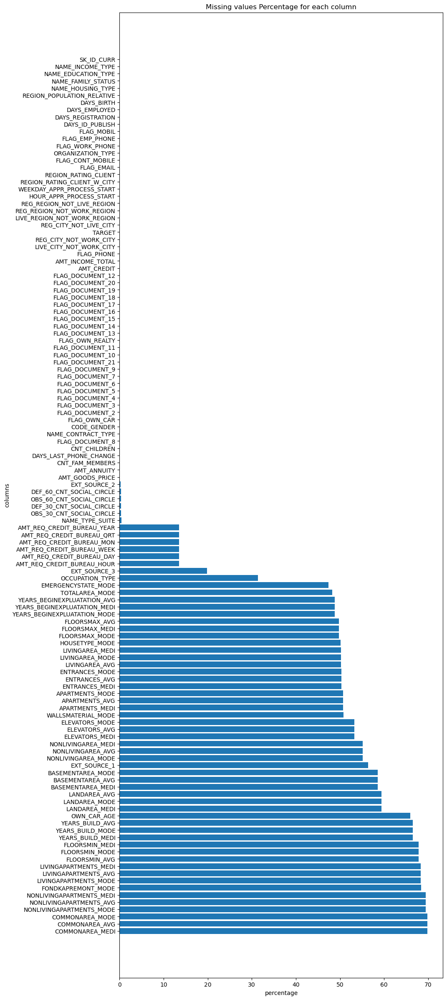

In [18]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(application_train)

In [19]:
application_train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [20]:
application_train.select_dtypes('float64').apply(pd.Series.nunique,axis = 0)

AMT_INCOME_TOTAL               2548
AMT_CREDIT                     5603
AMT_ANNUITY                   13672
AMT_GOODS_PRICE                1002
REGION_POPULATION_RELATIVE       81
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY         9
AMT_REQ_CREDIT_BUREAU_WEEK        9
AMT_REQ_CREDIT_BUREAU_MON        24
AMT_REQ_CREDIT_BUREAU_QRT        11
AMT_REQ_CREDIT_BUREAU_YEAR       25
Length: 65, dtype: int64

In [21]:
application_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

In [22]:
application_train.select_dtypes('int64').apply(pd.Series.nunique, axis = 0)

SK_ID_CURR                     307511
TARGET                              2
CNT_CHILDREN                       15
DAYS_BIRTH                      17460
DAYS_EMPLOYED                   12574
DAYS_ID_PUBLISH                  6168
FLAG_MOBIL                          2
FLAG_EMP_PHONE                      2
FLAG_WORK_PHONE                     2
FLAG_CONT_MOBILE                    2
FLAG_PHONE                          2
FLAG_EMAIL                          2
REGION_RATING_CLIENT                3
REGION_RATING_CLIENT_W_CITY         3
HOUR_APPR_PROCESS_START            24
REG_REGION_NOT_LIVE_REGION          2
REG_REGION_NOT_WORK_REGION          2
LIVE_REGION_NOT_WORK_REGION         2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
FLAG_DOCUMENT_2                     2
FLAG_DOCUMENT_3                     2
FLAG_DOCUMENT_4                     2
FLAG_DOCUMENT_5                     2
FLAG_DOCUMENT_6                     2
FLAG_DOCUMEN

### Comparons application_test et application_train
### Let's compare application_test and application_train

#### The Application_train dataset consists of 307511 rows and 122 columns.
#### Each row has a unique ID 'SK_ID_CURR' and the output label is in the 'TARGET' column.
#### TARGET indicating 0: the loan has been repaid or 1: the loan has not been repaid.

#### Ce jeu de données se compose de 307511 lignes et de 122 colonnes.
#### Chaque ligne a un identifiant unique 'SK_ID_CURR' et l’étiquette de sortie se trouve dans la colonne 'TARGET'.
#### TARGET indiquant 0 : le prêt a été remboursé ou 1 : le prêt n’a pas été remboursé.

### Let's check the duplicate value

In [6]:
columns_without_id = [col for col in application_train.columns if col!='SK_ID_CURR']
#Checking for duplicates in the data.
application_train[application_train.duplicated(subset = columns_without_id, keep=False)]
print('The duplicates in the dataset:',application_train[application_train.duplicated(subset = columns_without_id, keep=False)]
      .shape[0])

The duplicates in the dataset: 0


### Let's explore categorical variables

### Study the variables of the dataframe from the application.csv file


In [24]:
application_test['NAME_CONTRACT_TYPE'].unique()
#application_test['NAME_CONTRACT_TYPE'].isna().any()

array(['Cash loans', 'Revolving loans'], dtype=object)

In [25]:
application_test['CODE_GENDER'].unique()

array(['F', 'M'], dtype=object)

In [26]:
application_test['FLAG_OWN_CAR'].unique()

array(['N', 'Y'], dtype=object)

In [27]:
application_test['FLAG_OWN_REALTY'].unique()

array(['Y', 'N'], dtype=object)

In [28]:
application_test['NAME_TYPE_SUITE'].unique()

array(['Unaccompanied', nan, 'Family', 'Spouse, partner',
       'Group of people', 'Other_B', 'Children', 'Other_A'], dtype=object)

In [29]:
application_test['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Pensioner', 'Commercial associate',
       'Businessman', 'Student', 'Unemployed'], dtype=object)

In [30]:
application_test['NAME_EDUCATION_TYPE'].unique()

array(['Higher education', 'Secondary / secondary special',
       'Incomplete higher', 'Lower secondary', 'Academic degree'],
      dtype=object)

In [31]:
application_test['NAME_FAMILY_STATUS'].unique()

array(['Married', 'Single / not married', 'Civil marriage', 'Widow',
       'Separated'], dtype=object)

In [32]:
application_test['NAME_HOUSING_TYPE'].unique()

array(['House / apartment', 'With parents', 'Rented apartment',
       'Municipal apartment', 'Office apartment', 'Co-op apartment'],
      dtype=object)

In [33]:
application_test['OCCUPATION_TYPE'].unique()

array([nan, 'Low-skill Laborers', 'Drivers', 'Sales staff',
       'High skill tech staff', 'Core staff', 'Laborers', 'Managers',
       'Accountants', 'Medicine staff', 'Security staff',
       'Private service staff', 'Secretaries', 'Cleaning staff',
       'Cooking staff', 'HR staff', 'Waiters/barmen staff',
       'Realty agents', 'IT staff'], dtype=object)

In [34]:
application_test['WEEKDAY_APPR_PROCESS_START'].unique()

array(['TUESDAY', 'FRIDAY', 'MONDAY', 'WEDNESDAY', 'THURSDAY', 'SATURDAY',
       'SUNDAY'], dtype=object)

In [35]:
application_test['ORGANIZATION_TYPE'].unique()

array(['Kindergarten', 'Self-employed', 'Transport: type 3',
       'Business Entity Type 3', 'Government', 'Industry: type 9',
       'School', 'Trade: type 2', 'XNA', 'Services', 'Bank',
       'Industry: type 3', 'Other', 'Trade: type 6', 'Industry: type 12',
       'Trade: type 7', 'Postal', 'Medicine', 'Housing',
       'Business Entity Type 2', 'Construction', 'Military',
       'Industry: type 4', 'Trade: type 3', 'Legal Services', 'Security',
       'Industry: type 11', 'University', 'Business Entity Type 1',
       'Agriculture', 'Security Ministries', 'Transport: type 2',
       'Industry: type 7', 'Transport: type 4', 'Telecom', 'Emergency',
       'Police', 'Industry: type 1', 'Transport: type 1', 'Electricity',
       'Industry: type 5', 'Hotel', 'Restaurant', 'Advertising', 'Mobile',
       'Trade: type 1', 'Industry: type 8', 'Realtor', 'Cleaning',
       'Industry: type 2', 'Trade: type 4', 'Industry: type 6', 'Culture',
       'Insurance', 'Religion', 'Industry: type 1

In [36]:
application_test['FONDKAPREMONT_MODE'].unique()

array([nan, 'reg oper account', 'not specified', 'org spec account',
       'reg oper spec account'], dtype=object)

In [37]:
application_test['HOUSETYPE_MODE'].unique()

array(['block of flats', nan, 'specific housing', 'terraced house'],
      dtype=object)

In [38]:
application_test['WALLSMATERIAL_MODE'].unique()

array(['Stone, brick', nan, 'Panel', 'Block', 'Wooden', 'Mixed',
       'Monolithic', 'Others'], dtype=object)

In [39]:
application_test['EMERGENCYSTATE_MODE'].unique()

array(['No', nan, 'Yes'], dtype=object)

### Study the variables of the dataframe from the Business.csv file


In [7]:
previous_credit = pd.read_csv('Credit_to_spend/bureau.csv')
previous_credit.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [8]:
previous_credit.info(verbose=True, null_counts=True)

C:\Users\nadia\AppData\Local\Temp\ipykernel_18336\2023445707.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  previous_credit.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   SK_ID_CURR              1716428 non-null  int64  
 1   SK_ID_BUREAU            1716428 non-null  int64  
 2   CREDIT_ACTIVE           1716428 non-null  object 
 3   CREDIT_CURRENCY         1716428 non-null  object 
 4   DAYS_CREDIT             1716428 non-null  int64  
 5   CREDIT_DAY_OVERDUE      1716428 non-null  int64  
 6   DAYS_CREDIT_ENDDATE     1610875 non-null  float64
 7   DAYS_ENDDATE_FACT       1082775 non-null  float64
 8   AMT_CREDIT_MAX_OVERDUE  591940 non-null   float64
 9   CNT_CREDIT_PROLONG      1716428 non-null  int64  
 10  AMT_CREDIT_SUM          1716415 non-null  float64
 11  AMT_CREDIT_SUM_DEBT     1458759 non-null  float64
 12  AMT_CREDIT_SUM_LIMIT    1124648 non-null  float64
 13  AMT_CREDIT_SUM_OVERDUE  1716428 non-null  float64
 14  CR

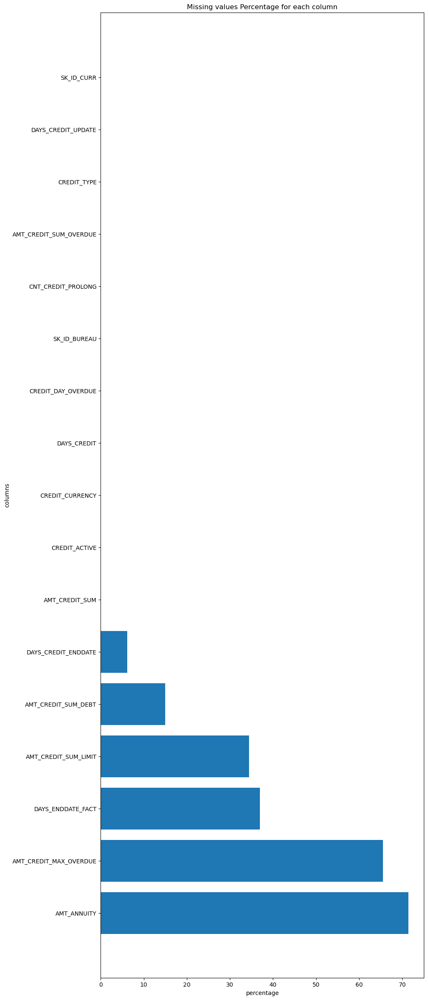

In [42]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(previous_credit)

In [43]:
previous_credit.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

CREDIT_ACTIVE       4
CREDIT_CURRENCY     4
CREDIT_TYPE        15
dtype: int64

In [44]:
previous_credit['CREDIT_ACTIVE'].unique()

array(['Closed', 'Active', 'Sold', 'Bad debt'], dtype=object)

In [45]:
previous_credit['CREDIT_CURRENCY'].unique()

array(['currency 1', 'currency 2', 'currency 4', 'currency 3'],
      dtype=object)

In [46]:
previous_credit['CREDIT_TYPE'].unique()

array(['Consumer credit', 'Credit card', 'Mortgage', 'Car loan',
       'Microloan', 'Loan for working capital replenishment',
       'Loan for business development', 'Real estate loan',
       'Unknown type of loan', 'Another type of loan',
       'Cash loan (non-earmarked)', 'Loan for the purchase of equipment',
       'Mobile operator loan', 'Interbank credit',
       'Loan for purchase of shares (margin lending)'], dtype=object)

### Study the variables of the dataframe from the bureau_balance.csv file


In [9]:
monthly_previous_credits = pd.read_csv('Credit_to_spend/bureau_balance.csv')
monthly_previous_credits.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [8]:
monthly_previous_credits.info(verbose=True, null_counts=True)


C:\Users\nadia\AppData\Local\Temp\ipykernel_15652\2137613355.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  monthly_previous_credits.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Non-Null Count     Dtype 
---  ------          --------------     ----- 
 0   SK_ID_BUREAU    27299925 non-null  int64 
 1   MONTHS_BALANCE  27299925 non-null  int64 
 2   STATUS          27299925 non-null  object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


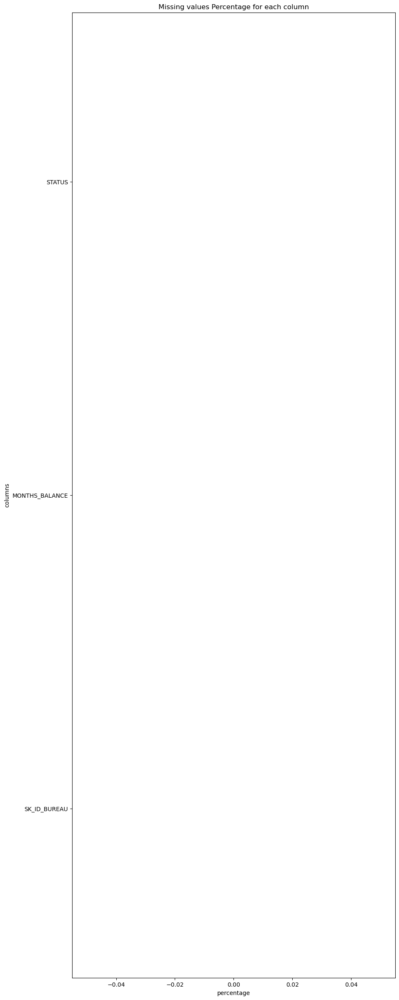

In [49]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(monthly_previous_credits)


In [50]:
monthly_previous_credits.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

STATUS    8
dtype: int64

In [51]:
monthly_previous_credits['STATUS'].unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

### Study the variables of the dataframe from the POS_CASH_balance.csv file

In [10]:
previous_cash_credit = pd.read_csv('Credit_to_spend/POS_CASH_balance.csv')
previous_cash_credit.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [53]:
previous_cash_credit.info(verbose=True, null_counts=True)

C:\Users\nadia\AppData\Local\Temp\ipykernel_16900\1352350374.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  previous_cash_credit.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Non-Null Count     Dtype  
---  ------                 --------------     -----  
 0   SK_ID_PREV             10001358 non-null  int64  
 1   SK_ID_CURR             10001358 non-null  int64  
 2   MONTHS_BALANCE         10001358 non-null  int64  
 3   CNT_INSTALMENT         9975287 non-null   float64
 4   CNT_INSTALMENT_FUTURE  9975271 non-null   float64
 5   NAME_CONTRACT_STATUS   10001358 non-null  object 
 6   SK_DPD                 10001358 non-null  int64  
 7   SK_DPD_DEF             10001358 non-null  int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


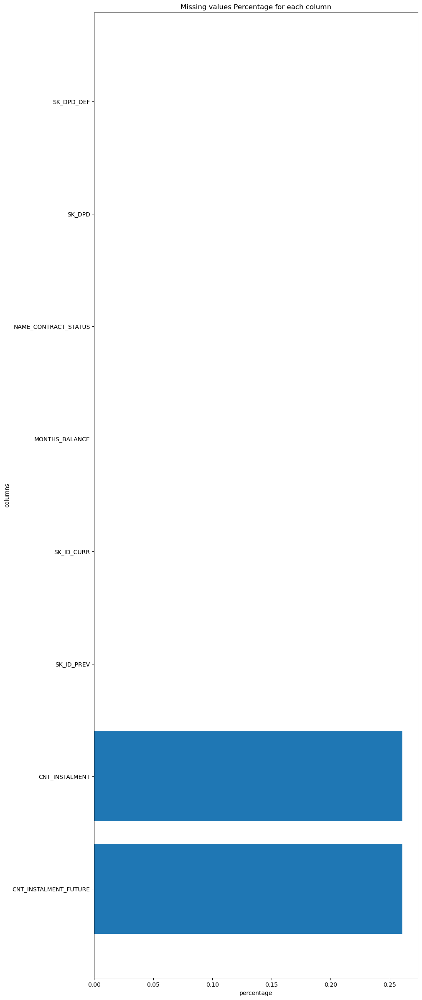

In [54]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(previous_cash_credit)

In [55]:
previous_cash_credit.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_STATUS    9
dtype: int64

In [56]:
previous_cash_credit['NAME_CONTRACT_STATUS'].unique()

array(['Active', 'Completed', 'Signed', 'Approved',
       'Returned to the store', 'Demand', 'Canceled', 'XNA',
       'Amortized debt'], dtype=object)

### Study the variables of the dataframe from the credit_card_balance.csv file

In [11]:
credit_card_balance = pd.read_csv('Credit_to_spend/credit_card_balance.csv')
credit_card_balance.head()


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [58]:
credit_card_balance.info(verbose=True, null_counts=True)


C:\Users\nadia\AppData\Local\Temp\ipykernel_16900\293336847.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  credit_card_balance.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   SK_ID_PREV                  3840312 non-null  int64  
 1   SK_ID_CURR                  3840312 non-null  int64  
 2   MONTHS_BALANCE              3840312 non-null  int64  
 3   AMT_BALANCE                 3840312 non-null  float64
 4   AMT_CREDIT_LIMIT_ACTUAL     3840312 non-null  int64  
 5   AMT_DRAWINGS_ATM_CURRENT    3090496 non-null  float64
 6   AMT_DRAWINGS_CURRENT        3840312 non-null  float64
 7   AMT_DRAWINGS_OTHER_CURRENT  3090496 non-null  float64
 8   AMT_DRAWINGS_POS_CURRENT    3090496 non-null  float64
 9   AMT_INST_MIN_REGULARITY     3535076 non-null  float64
 10  AMT_PAYMENT_CURRENT         3072324 non-null  float64
 11  AMT_PAYMENT_TOTAL_CURRENT   3840312 non-null  float64
 12  AMT_RECEIVABLE_PRINCIPAL    3840312 non-null  float64
 1

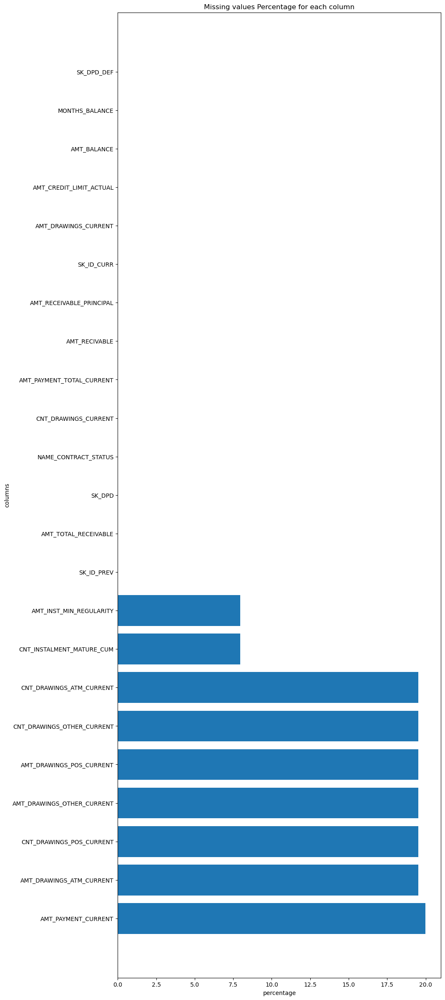

In [11]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(credit_card_balance)

In [60]:
credit_card_balance.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_STATUS    7
dtype: int64

In [61]:
credit_card_balance['NAME_CONTRACT_STATUS'].unique()

array(['Active', 'Completed', 'Demand', 'Signed', 'Sent proposal',
       'Refused', 'Approved'], dtype=object)

In [12]:
previous_credit = pd.read_csv('Credit_to_spend/installments_payments.csv')
previous_credit.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [63]:
previous_credit.info(verbose=True, null_counts=True)

C:\Users\nadia\AppData\Local\Temp\ipykernel_16900\2023445707.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  previous_credit.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Non-Null Count     Dtype  
---  ------                  --------------     -----  
 0   SK_ID_PREV              13605401 non-null  int64  
 1   SK_ID_CURR              13605401 non-null  int64  
 2   NUM_INSTALMENT_VERSION  13605401 non-null  float64
 3   NUM_INSTALMENT_NUMBER   13605401 non-null  int64  
 4   DAYS_INSTALMENT         13605401 non-null  float64
 5   DAYS_ENTRY_PAYMENT      13602496 non-null  float64
 6   AMT_INSTALMENT          13605401 non-null  float64
 7   AMT_PAYMENT             13602496 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [64]:
previous_credit.dtypes.value_counts()

float64    5
int64      3
dtype: int64

In [65]:
previous_credit.isna().any()

SK_ID_PREV                False
SK_ID_CURR                False
NUM_INSTALMENT_VERSION    False
NUM_INSTALMENT_NUMBER     False
DAYS_INSTALMENT           False
DAYS_ENTRY_PAYMENT         True
AMT_INSTALMENT            False
AMT_PAYMENT                True
dtype: bool

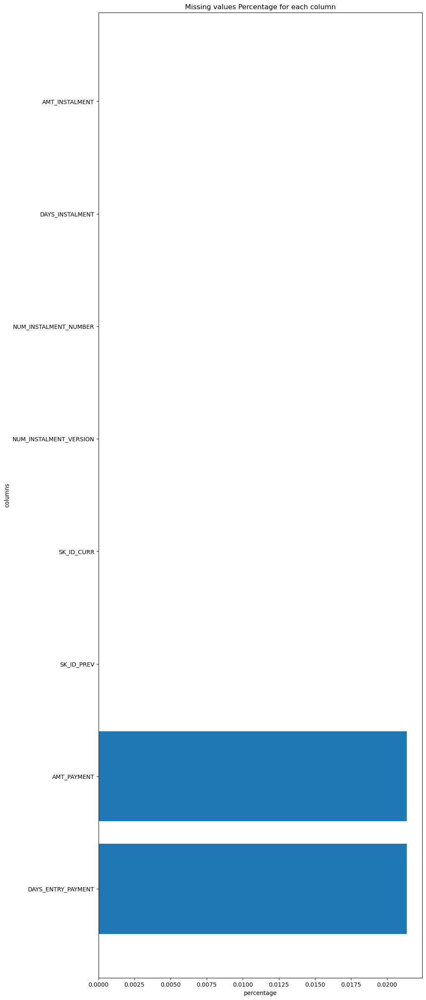

In [66]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(previous_credit)

### Manage anormal data

In [13]:
(application_train['DAYS_BIRTH']/-365).describe()



count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [14]:
application_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

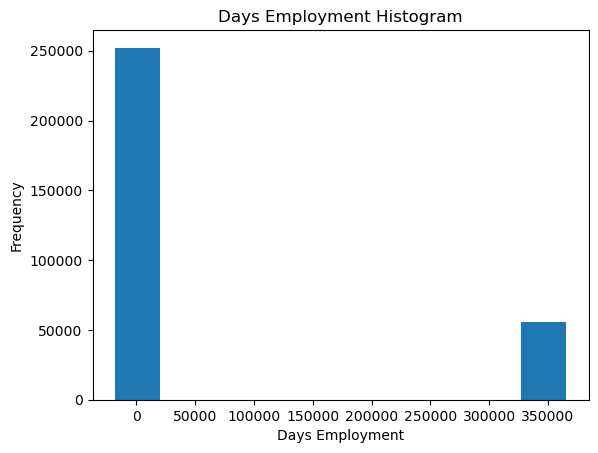

In [15]:
application_train['DAYS_EMPLOYED'].plot.hist(title ='Days Employment Histogram');
plt.xlabel('Days Employment');

In [16]:
def manage_nulls_outliers(df):
        
    df['NAME_FAMILY_STATUS'].fillna('Data_Not_Available', inplace=True)
    df['NAME_HOUSING_TYPE'].fillna('Data_Not_Available', inplace=True)

    df['FLAG_MOBIL'].fillna('Data_Not_Available', inplace=True)
    df['FLAG_EMP_PHONE'].fillna('Data_Not_Available', inplace=True)
    df['FLAG_CONT_MOBILE'].fillna('Data_Not_Available', inplace=True)
    df['FLAG_EMAIL'].fillna('Data_Not_Available', inplace=True)

    df['OCCUPATION_TYPE'].fillna('Data_Not_Available', inplace=True)

    #Replace NA with the most frequently occuring class for Count of Client Family Members
    df['CNT_FAM_MEMBERS'].fillna(df['CNT_FAM_MEMBERS'].value_counts().idxmax(), \
                                             inplace=True)
        
    df.replace(max(df['DAYS_EMPLOYED'].values), np.nan, inplace=True)

    df['CODE_GENDER'].replace('XNA','M',inplace=True)
    #There are a total of 4 applicants with Gender provided as 'XNA'

    df['AMT_ANNUITY'].fillna(0, inplace=True)
    #A total of 36 datapoints are there where Annuity Amount is null.

    df['AMT_GOODS_PRICE'].fillna(0, inplace=True)
    #A total of 278 datapoints are there where Annuity Amount is null.

    df['NAME_TYPE_SUITE'].fillna('Unaccompanied', inplace=True)
    #Removing datapoints where 'Name_Type_Suite' is null.

    df['NAME_FAMILY_STATUS'].replace('Unknown','Married', inplace=True)
    #Removing datapoints where 'Name_Family_Status' is Unknown.

    df['OCCUPATION_TYPE'].fillna('Data_Not_Available', inplace=True)
    application_train['DAYS_BIRTH'] = round(application_train['DAYS_BIRTH'] *-1/ 365)

    # abs - convert all value in to postive
    df['DAYS_EMPLOYED']  = abs(df['DAYS_EMPLOYED'])
    df['DAYS_EMPLOYED'].head(2)

    # Replace the anomalous values(Errorness value) with nan
    df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'].replace({365243: np.nan})

    # Convert days in to years
    df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'] /365
    df.loc[df['OBS_30_CNT_SOCIAL_CIRCLE'] > 30, 'OBS_30_CNT_SOCIAL_CIRCLE'] = np.nan
    df.loc[df['OBS_60_CNT_SOCIAL_CIRCLE'] > 30, 'OBS_60_CNT_SOCIAL_CIRCLE'] = np.nan
  

    df['EXT_SOURCE_1'].fillna(0, inplace=True)
    df['EXT_SOURCE_2'].fillna(0, inplace=True)
    df['EXT_SOURCE_3'].fillna(0, inplace=True)
    
    return df.describe()
manage_nulls_outliers(application_train)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307510.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,252137.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.235456,0.080729,0.417052,1.687979e+05,5.990260e+05,27107.516051,5.379095e+05,0.020868,43.938646,6.531971,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.222581,0.272419,0.722121,2.371231e+05,4.024908e+05,14494.443757,3.696338e+05,0.013831,11.964047,6.406466,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,0.000000,0.000000e+00,0.000290,21.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.250000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,34.000000,2.101370,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278201.500000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,43.000000,4.515068,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.750000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,54.000000,8.698630,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,69.000000,49.073973,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


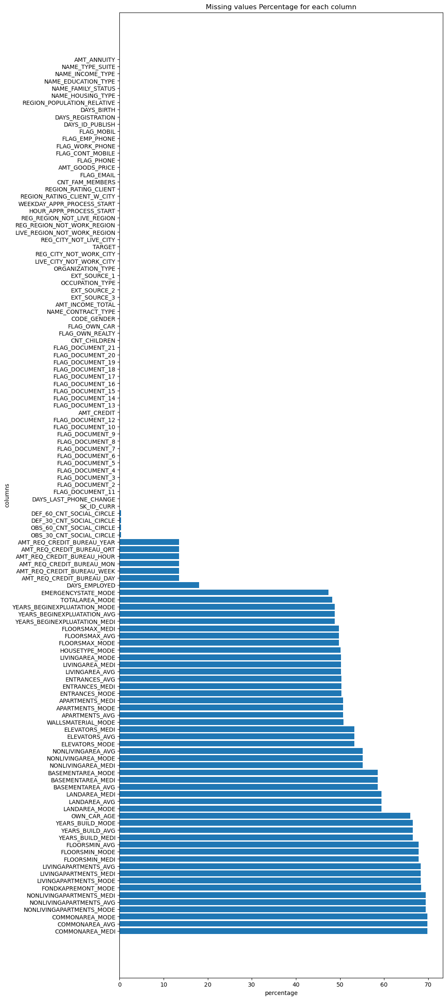

In [17]:
def PercentageMissingValues(df):
    plt.figure(figsize=(10,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(application_train)

In [17]:
application_train['DAYS_EMPLOYED'].describe()

count    252137.000000
mean          6.531971
std           6.406466
min           0.000000
25%           2.101370
50%           4.515068
75%           8.698630
max          49.073973
Name: DAYS_EMPLOYED, dtype: float64

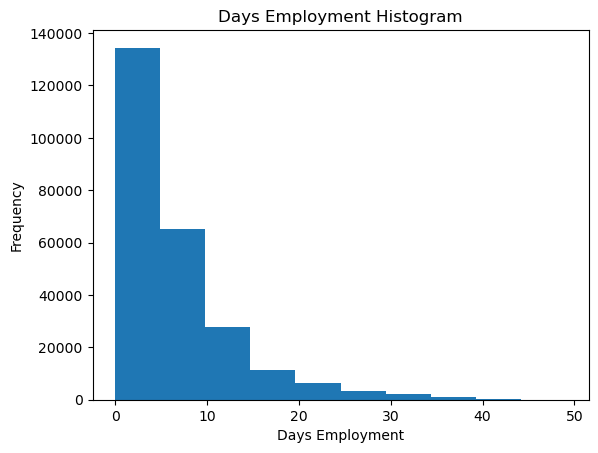

In [18]:
application_train['DAYS_EMPLOYED'].plot.hist(title ='Days Employment Histogram');
plt.xlabel('Days Employment');

### Nous allons utiliser le label encoding pour traiter les variables qualitatives a deux valeurs

In [19]:
from sklearn.preprocessing import LabelEncoder
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in application_train:
    if application_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(application_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(application_train[col])
            # Transform both training and testing data
            application_train[col] = le.transform(application_train[col])
            application_test[col] = le.transform(application_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

4 columns were label encoded.


### Nous allons utiliser le "One Hot Encoding " pour traiter le reste de nos variables quantitaves non ordinales

In [20]:
# one-hot encoding of categorical variables > 2
application_train = pd.get_dummies(application_train)
application_test = pd.get_dummies(application_test)

print('Training Features shape: ', application_train.shape)
print('Testing Features shape: ', application_test.shape)

Training Features shape:  (307511, 241)
Testing Features shape:  (48744, 238)


# Step 3 Collect and prepare data

<AxesSubplot:xlabel='TARGET', ylabel='count'>

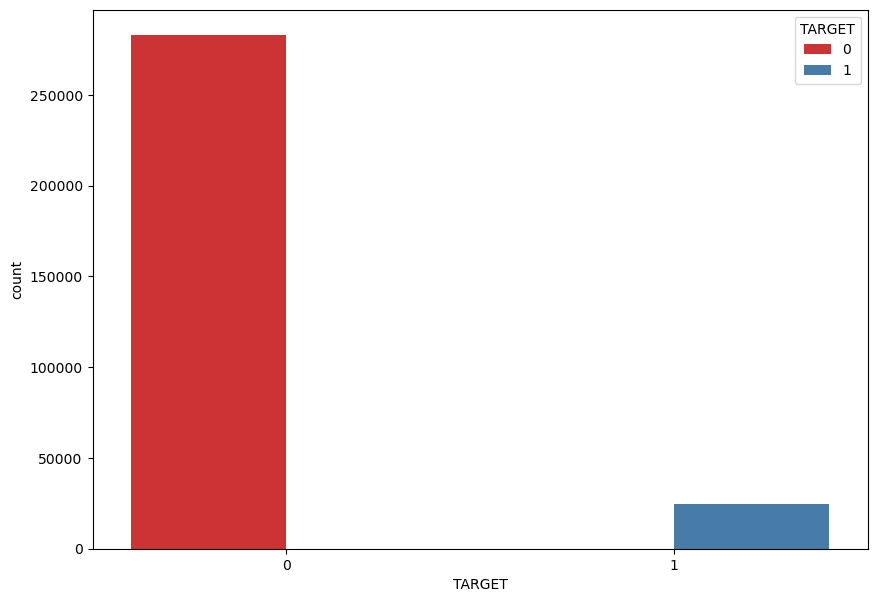

In [76]:
fig, ax = plt.subplots(figsize=(10,7))
sns.countplot(x ='TARGET',data=application_train, hue='TARGET',palette="Set1")

#### Il doit y avoir les mêmes caractéristiques (colonnes) dans les données de formation et de test. L'encodage à chaud a créé plus de colonnes dans les données d'apprentissage car il y avait des variables catégorielles avec des catégories non représentées dans les données de test. Pour supprimer les colonnes des données d'entraînement qui ne figurent pas dans les données de test, nous devons aligner les dataframes. Nous extrayons d'abord la colonne cible des données d'apprentissage (car cela ne figure pas dans les données de test, mais nous devons conserver ces informations). Lorsque nous faisons l'alignement, nous devons nous assurer de définir axis = 1 pour aligner les dataframes en fonction des colonnes et non des lignes !

In [21]:
train_labels = application_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
application_train, application_test = application_train.align(application_test, join = 'inner', axis = 1)

# Add the target back in
application_train['TARGET'] = train_labels

print('Training Features shape: ', application_train.shape)
print('Testing Features shape: ', application_test.shape)

Training Features shape:  (307511, 239)
Testing Features shape:  (48744, 238)


### Calculate and check the monthly credits in  progress

In [22]:
bureau = pd.read_csv('Credit_to_spend/bureau.csv')
bureau.head(10)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.00,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.00,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
5,215354,5714467,Active,currency 1,-273,0,27460.0,NaN,0.0,0,180000.00,71017.38,108982.62,0.0,Credit card,-31,NaN
6,215354,5714468,Active,currency 1,-43,0,79.0,NaN,0.0,0,42103.80,42103.80,0.00,0.0,Consumer credit,-22,NaN
7,162297,5714469,Closed,currency 1,-1896,0,-1684.0,-1710.0,14985.0,0,76878.45,0.00,0.00,0.0,Consumer credit,-1710,NaN
8,162297,5714470,Closed,currency 1,-1146,0,-811.0,-840.0,0.0,0,103007.70,0.00,0.00,0.0,Consumer credit,-840,NaN
9,162297,5714471,Active,currency 1,-1146,0,-484.0,NaN,0.0,0,4500.00,0.00,0.00,0.0,Credit card,-690,NaN


In [79]:
application_train.head(10)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET
0,100002.0,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,0,1,0,1,0,1
1,100003.0,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,1,0,0,0,0,0,0,1,0,0
2,100004.0,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,0,0,0,0,0,0
3,100006.0,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,0,0,0,0,0,0
4,100007.0,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0,0,0,0,0,0
5,100008.0,0,1,0,1,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,0,0,0,0,0,0
6,100009.0,0,0,1,1,1,171000.0,1560726.0,41301.0,1395000.0,...,0,0,0,0,0,0,0,0,0,0
7,100010.0,0,1,1,1,0,360000.0,1530000.0,42075.0,1530000.0,...,0,0,0,0,0,0,0,0,0,0
8,100011.0,0,0,0,1,0,112500.0,1019610.0,33826.5,913500.0,...,0,0,0,0,0,0,0,0,0,0
9,100012.0,1,1,0,1,0,135000.0,405000.0,20250.0,405000.0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
#Filtrer d'abord les champs numériques
numerical_col = list(application_train.select_dtypes(exclude=["object"]).columns)


In [25]:
# supprimez les champs avec seulement 2 valeurs (généralement 0,1)
numerical_col = list(application_train[numerical_col].columns[list(application_train[numerical_col].apply(lambda x:len(x.unique())!=2 ))])
print("Numbers of remain columns %s" % len(numerical_col))

Numbers of remain columns 73


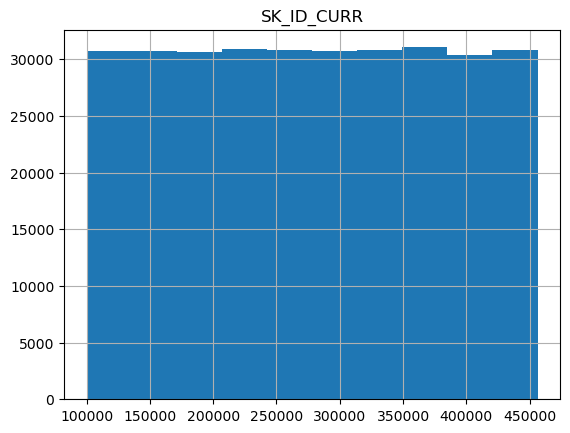

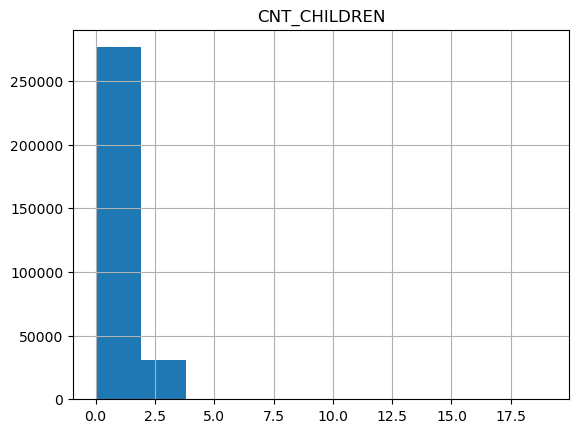

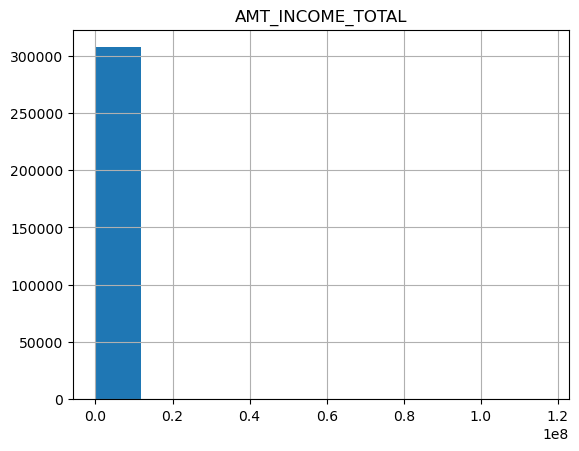

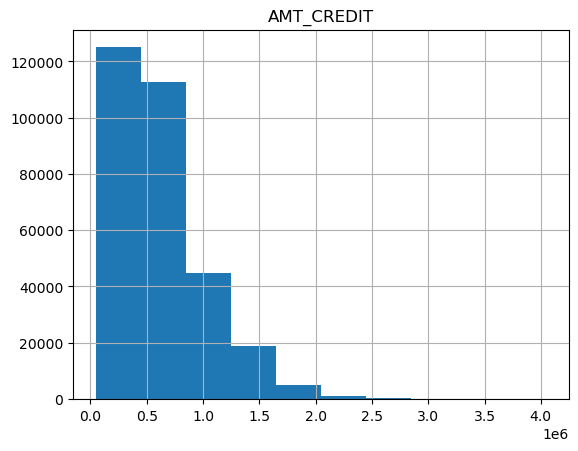

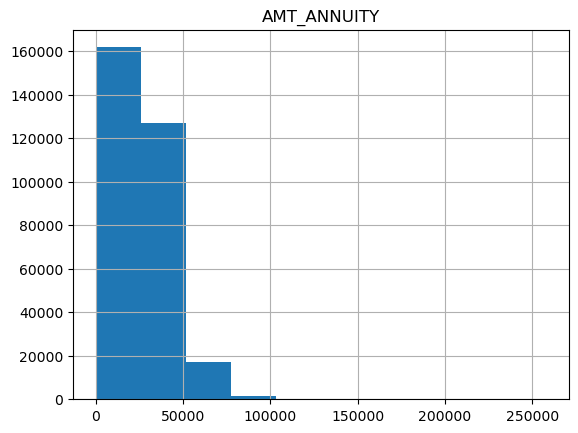

...

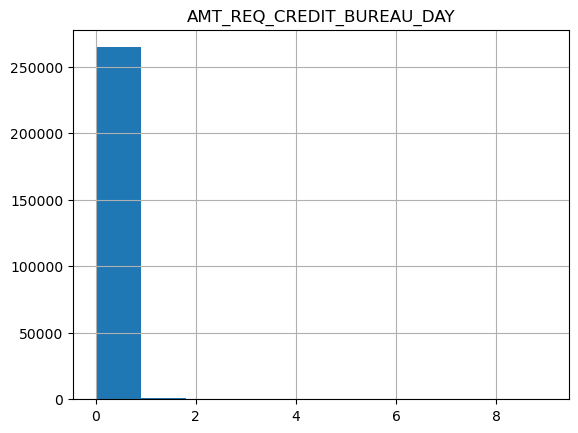

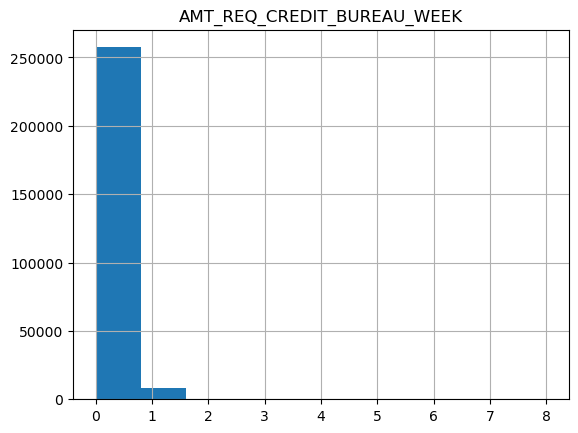

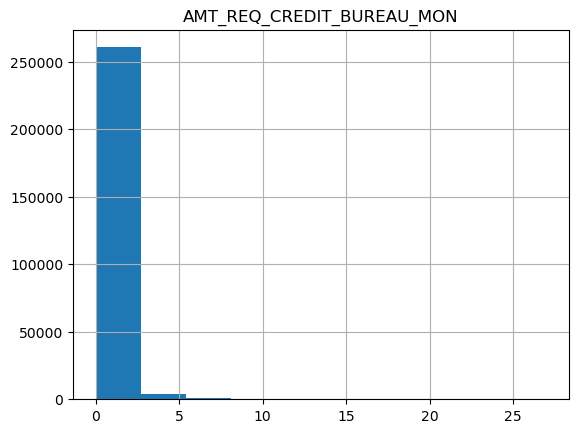

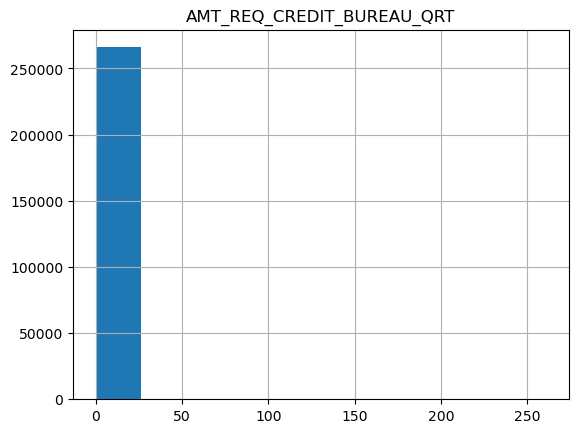

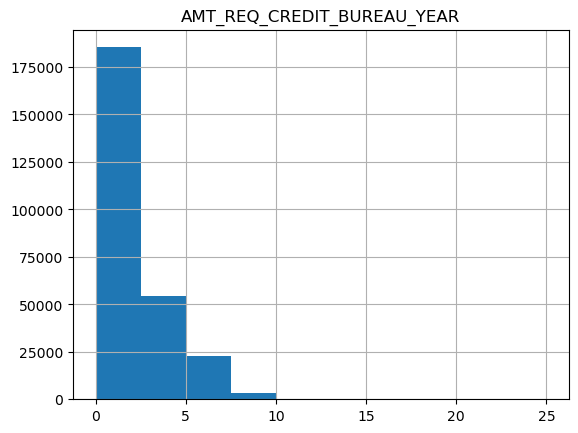

In [26]:
for col in numerical_col:
    ax = application_train[col].hist()
    ax.set_title(col)
    plt.show()


<AxesSubplot:xlabel='CODE_GENDER', ylabel='count'>

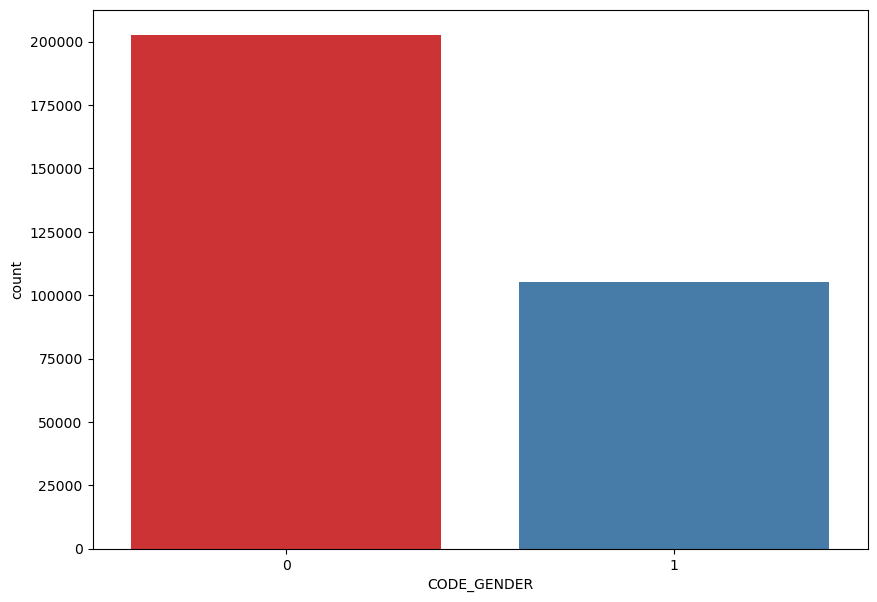

In [83]:
fig, ax = plt.subplots(figsize=(10,7))
sns.countplot(x='CODE_GENDER',data=application_train,palette="Set1")


<AxesSubplot:xlabel='TARGET', ylabel='count'>

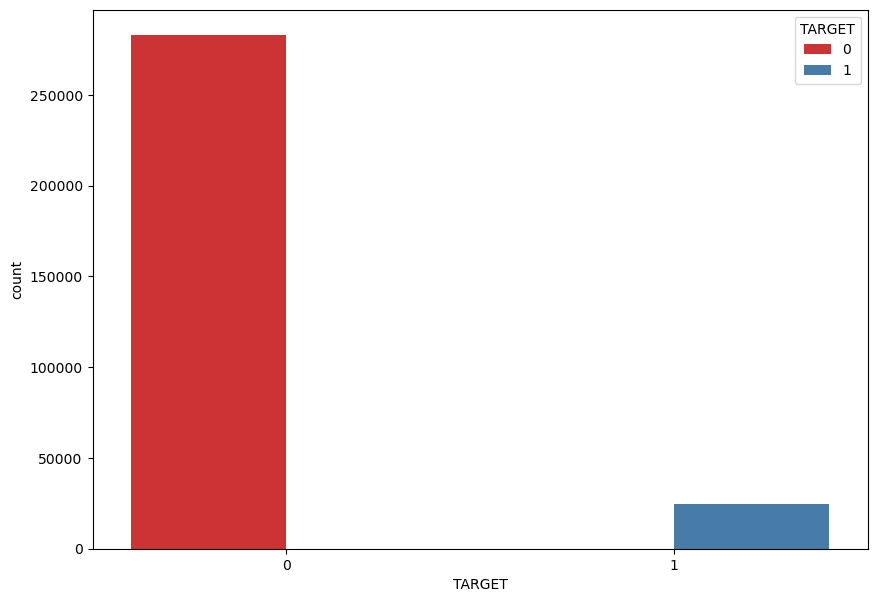

In [84]:
fig, ax = plt.subplots(figsize=(10,7))
sns.countplot(x ='TARGET',data=application_train, hue='TARGET',palette="Set1")

Text(0.5, 0, 'CODE_GENDER')

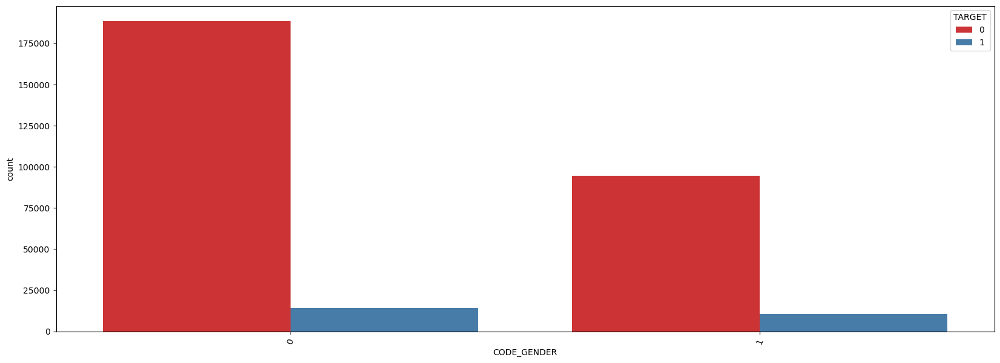

In [85]:
fig, ax = plt.subplots(figsize=(20,7))
sns.countplot(x='CODE_GENDER',hue='TARGET',data=application_train,palette="Set1")
plt.xticks(rotation=70)
plt.xlabel("CODE_GENDER")


Text(0.5, 0, 'NAME_CONTRACT_TYPE')

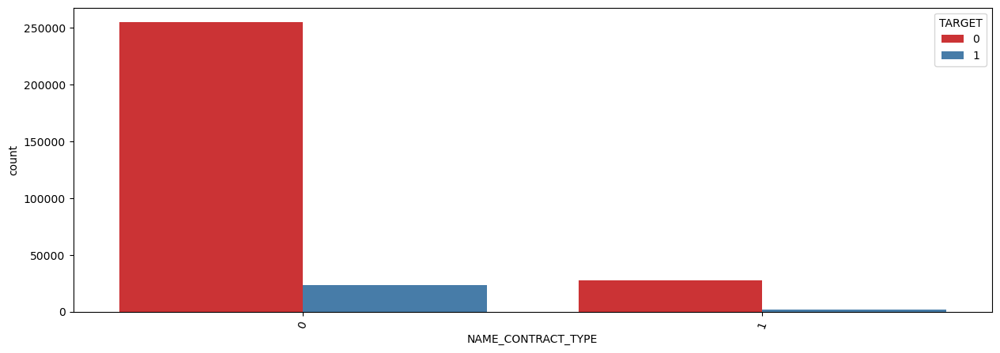

In [86]:
fig, ax = plt.subplots(figsize=(15,5))
sns.countplot(x='NAME_CONTRACT_TYPE',hue='TARGET',data=application_train,palette="Set1")
plt.xticks(rotation=70)
plt.xlabel('NAME_CONTRACT_TYPE')

## Feature Engineering

#### To make sense For our Model , let's enrich it with business data useful for decision-making
#### * Debt ratio must not exceed according to the bank 33% or maximum 35%
#### * If possible calculate the rest to live(We only have the total credits, but not the total resources, nor the total expenses we can     use total credits) if an applicant has too many loans he might be in financial difficulties.
#### * Check if on all past credits there have been payment incidents or not 
#### * And the amount that the borrower must pay to the bank at the time of default
#### * Total payment defaults
#### *Number of times the borrower has been late 30-59 days, but no worse in the past 2 years.

####  Pour donner du sens à notre Modèle, enrichissons-le avec des données métiers utiles à la prise de décision
#### *Le taux d'endettement ne doit pas dépasser selon la banque 33% ou maximum 35%
#### * Si possible calculez le reste à vivre (nous n'avons que le total des crédits, mais pas le total des ressources, ni le total des dépenses nous pouvons utiliser le total des crédits) si un demandeur a trop de prêts il pourrait avoir des difficultés financières.
#### * Vérifier si sur tous les crédits passés il y a eu des incidents de paiement ou non
#### * Et le montant que l'emprunteur doit payer à la banque au moment du défaut
#### * Total des défauts de paiement
#### *Nombre de fois que l'emprunteur a été en retard de 30 à 59 jours, mais pas pire au cours des 2 dernières années.

#### * Le pourcentage du montant du crédit par rapport au revenu d'un client
#### * Le pourcentage de l'annuité du prêt par rapport au revenu d'un client
#### * La durée du paiement en mois (puisque l'annuité est le montant mensuel dû
#### * Le pourcentage de jours employés par rapport à l'âge du client

In [27]:
app_train_business = application_train.copy()
app_test_business = application_train.copy()
app_train_business['CREDIT_PRICE_RATIO'] = app_train_business["AMT_CREDIT"]/app_train_business["AMT_GOODS_PRICE"]
app_train_business['Taux d endettement'] = app_train_business['AMT_CREDIT'] / app_train_business['AMT_INCOME_TOTAL']
app_train_business['Taux d endettement annuel'] = app_train_business['AMT_ANNUITY'] / app_train_business['AMT_INCOME_TOTAL']
app_train_business['CREDIT_TERM'] = app_train_business['AMT_ANNUITY'] / app_train_business['AMT_CREDIT']
app_train_business['DAYS_EMPLOYED_PERCENT'] = app_train_business['DAYS_EMPLOYED'] / app_train_business['DAYS_BIRTH']
app_train_business['CREDIT_TO_ANNUITY_RATIO'] = app_train_business['AMT_CREDIT'] / app_train_business['AMT_ANNUITY']
app_train_business['INCOME_TO_FAMILYSIZE_RATIO'] = app_train_business['AMT_INCOME_TOTAL'] / app_train_business['CNT_FAM_MEMBERS']

app_test_business['CREDIT_PRICE_RATIO'] = app_test_business["AMT_CREDIT"]/app_test_business["AMT_GOODS_PRICE"]
app_test_business['Taux d endettement'] = app_test_business['AMT_CREDIT'] / app_test_business['AMT_INCOME_TOTAL']
app_test_business['Taux d endettement annuel'] = app_test_business['AMT_ANNUITY'] / app_test_business['AMT_INCOME_TOTAL']
app_test_business['CREDIT_TERM'] = app_test_business['AMT_ANNUITY'] / app_test_business['AMT_CREDIT']
app_test_business['DAYS_EMPLOYED_PERCENT'] = app_test_business['DAYS_EMPLOYED'] / app_test_business['DAYS_BIRTH']
app_test_business['CREDIT_TO_ANNUITY_RATIO'] = app_test_business['AMT_CREDIT'] / app_test_business['AMT_ANNUITY']
app_test_business['INCOME_TO_FAMILYSIZE_RATIO'] = app_test_business['AMT_INCOME_TOTAL'] / app_test_business['CNT_FAM_MEMBERS']

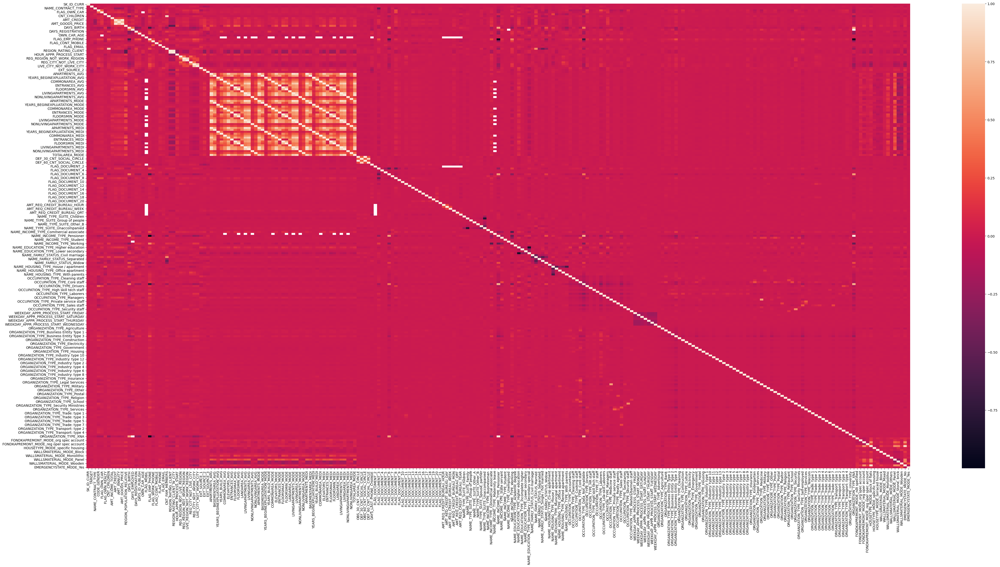

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(55, 25))
corrs = application_train.corr(method='pearson', min_periods=1)
sns.heatmap(corrs)
plt.show()

C:\Users\nadia\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 2000x2000 with 0 Axes>

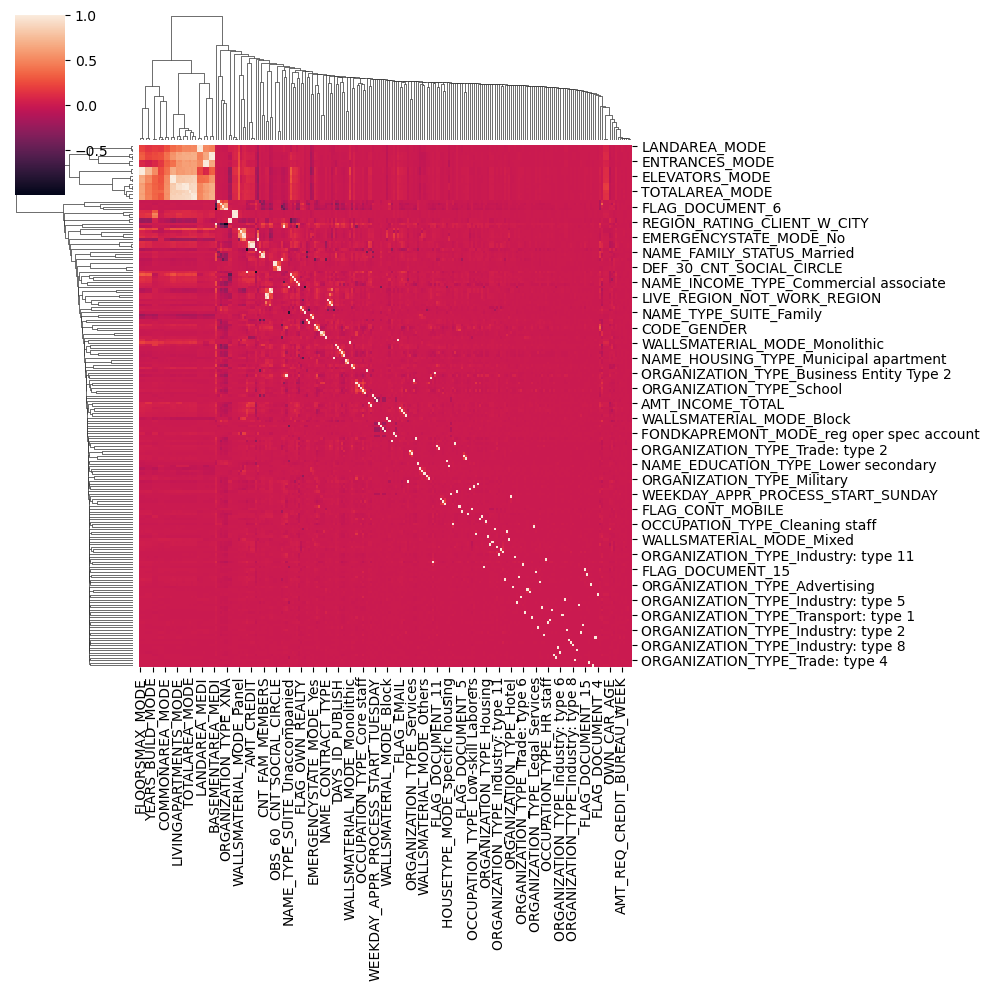

In [89]:
plt.figure(figsize=(20,20))
sns.clustermap(corrs.dropna())
plt.show()

In [28]:
# check columns correlations
correlation = pd.DataFrame(app_train_business.corr(method = 'pearson'))
correlation.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET,CREDIT_PRICE_RATIO,Taux d endettement,Taux d endettement annuel,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,CREDIT_TO_ANNUITY_RATIO,INCOME_TO_FAMILYSIZE_RATIO
SK_ID_CURR,1.000000,0.001655,-0.000753,0.001212,0.000707,-0.001128,-0.001819,-0.000344,-0.000412,-0.000391,...,0.000507,0.002549,-0.002108,-0.001059,-0.001730,-0.002337,0.000349,-0.000130,0.000002,0.000195
NAME_CONTRACT_TYPE,0.001655,1.000000,-0.008699,0.004022,0.067177,0.029998,-0.003531,-0.221648,-0.241503,-0.188931,...,0.027372,-0.000339,-0.030896,-0.322348,-0.218026,-0.251171,-0.052272,-0.029026,-0.067433,-0.001557
CODE_GENDER,-0.000753,-0.008699,1.000000,0.345847,-0.044361,0.047394,0.074731,0.021587,0.076974,0.022534,...,-0.029347,-0.005172,0.054704,-0.002578,-0.125673,-0.118056,0.071902,-0.080721,-0.062546,0.052251
FLAG_OWN_CAR,0.001212,0.004022,0.345847,1.000000,-0.002817,0.102023,0.083383,0.116225,0.141590,0.121112,...,-0.034754,-0.007584,-0.021851,-0.036488,-0.041364,-0.062256,-0.005227,-0.006767,0.018032,0.039654
FLAG_OWN_REALTY,0.000707,0.067177,-0.044361,-0.002817,1.000000,-0.002366,0.002934,-0.039270,-0.005154,-0.045787,...,0.022013,-0.008535,-0.006148,0.029953,-0.048835,-0.020081,0.047346,0.007317,-0.074475,-0.001592


### In order to remove the less important variables before encoding, let's study the correlation with the target variable
### Afin de retirer avant l'encodage les variables moins importantes , etudions la correlation avec la variable target
### Le coefficient de corrélation linéaire rrr donne une mesure de l'intensité et du sens de la relation linéaire entre deux variables. 
### Le coefficient de corrélation est compris entre -1  et 1.
### Plus le coefficient est proche de 111, plus la relation linéaire positive entre les variables est forte.
### Plus le coefficient est proche de -1−1minus, 1, plus la relation linéaire négative entre les variables est forte.
### Plus le coefficient est proche de 000, plus la relation linéaire entre les variables est faible.

### Trier les variables les moins correlées a TARGET 

In [29]:
# Let's find variables that are highly de-correlated from TARGET
corr_target_min_threshold = 0.01
high_target_decorrelated = pd.DataFrame(
    columns=["correlation with TARGET"]
)
for col in correlation.columns:
    if col != "TARGET" and (
        pd.isnull(correlation[col]["TARGET"])
        or abs(correlation[col]["TARGET"]) < corr_target_min_threshold
    ):
        high_target_decorrelated.loc[col] = {
            "correlation with TARGET": correlation[col]["TARGET"],
        }

high_target_decorrelated.sort_values(by=["correlation with TARGET"])

,correlation with TARGET
YEARS_BEGINEXPLUATATION_MEDI,-0.009993
ORGANIZATION_TYPE_Police,-0.009886
YEARS_BEGINEXPLUATATION_AVG,-0.009728
ORGANIZATION_TYPE_Bank,-0.009609
ORGANIZATION_TYPE_Security Ministries,-0.009470
...,...
ORGANIZATION_TYPE_Trade: type 3,0.008911
CNT_FAM_MEMBERS,0.009308
OBS_60_CNT_SOCIAL_CIRCLE,0.009513
OBS_30_CNT_SOCIAL_CIRCLE,0.009628


### Trier les valeurs tres correlées ce qui equivaut a une information redondante 

In [30]:
# Let's find variables that have a highly correlated pair
pair_corr_max_threshold = 0.9
highly_correlated = pd.DataFrame(columns=["pair", "correlation"])
for i in range(len(correlation.columns)):
    for j in range(i + 1, len(correlation.columns)):
        if correlation.iloc[i, j] > pair_corr_max_threshold:
            # variables are highly correlated
            if correlation.iloc[0, i] > correlation.iloc[0, j]:
                # first variable is more correlated with target
                # => we want to keep it
                keep_index = i
                drop_index = j
            else:
                keep_index = j
                drop_index = i

            highly_correlated.loc[correlation.columns[drop_index]] = {
                "pair": correlation.columns[keep_index],
                "correlation": correlation.iloc[i, j],
            }

highly_correlated.sort_values(by="correlation", ascending=False)

,pair,correlation
ORGANIZATION_TYPE_XNA,NAME_INCOME_TYPE_Pensioner,0.999648
YEARS_BUILD_MEDI,YEARS_BUILD_AVG,0.998495
OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998378
FLOORSMIN_MEDI,FLOORSMIN_AVG,0.997241
FLOORSMAX_MEDI,FLOORSMAX_AVG,0.997034
ENTRANCES_AVG,ENTRANCES_MEDI,0.996886
ELEVATORS_AVG,ELEVATORS_MEDI,0.996099
COMMONAREA_AVG,COMMONAREA_MEDI,0.995978
BASEMENTAREA_AVG,BASEMENTAREA_MEDI,0.994317
LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MEDI,0.993825


### Cette analyse consistait a reduire la quantité de donnée pour faciliter l'apprentissage et la prediction de TARGET
### Nous allons donc supprimer  les variables redondantes et les variables peu ou tres correlées a TARGET

In [31]:
# Drop irrelevant columns
app_train_business.drop(
    columns=high_target_decorrelated.index,
    inplace=True,
    errors="ignore",
)
app_train_business.drop(
    columns=highly_correlated.index,
    inplace=True,
    errors="ignore",
)

app_train_business.describe(include="all")

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,CNT_CHILDREN,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",TARGET,CREDIT_PRICE_RATIO,Taux d endettement annuel,CREDIT_TERM,CREDIT_TO_ANNUITY_RATIO
count,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,252137.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.0000,307511.000000,307511.000000,3.075110e+05
mean,0.095213,0.341656,0.340108,0.417052,5.990260e+05,27107.516051,0.020868,43.938646,6.531971,-4986.120328,...,0.240089,0.039283,0.489423,0.214757,0.210773,0.080729,inf,0.180923,0.053693,inf
std,0.293509,0.474266,0.473746,0.722121,4.024908e+05,14494.443757,0.013831,11.964047,6.406466,3522.886321,...,0.427138,0.194268,0.499889,0.410654,0.407858,0.272419,NaN,0.094579,0.022483,NaN
min,0.000000,0.000000,0.000000,0.000000,4.500000e+04,0.000000,0.000290,21.000000,0.000000,-24672.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.1500,0.000000,0.000000,8.036674e+00
25%,0.000000,0.000000,0.000000,0.000000,2.700000e+05,16524.000000,0.010006,34.000000,2.101370,-7479.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0000,0.114776,0.036900,1.561456e+01
50%,0.000000,0.000000,0.000000,0.000000,5.135310e+05,24903.000000,0.018850,43.000000,4.515068,-4504.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.1188,0.162833,0.050000,2.000000e+01
75%,0.000000,1.000000,1.000000,1.000000,8.086500e+05,34596.000000,0.028663,54.000000,8.698630,-2010.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.1980,0.229064,0.064043,2.709998e+01
max,1.000000,1.000000,1.000000,19.000000,4.050000e+06,258025.500000,0.072508,69.000000,49.073973,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,inf,1.875965,0.124430,inf


<AxesSubplot:xlabel='TARGET', ylabel='count'>

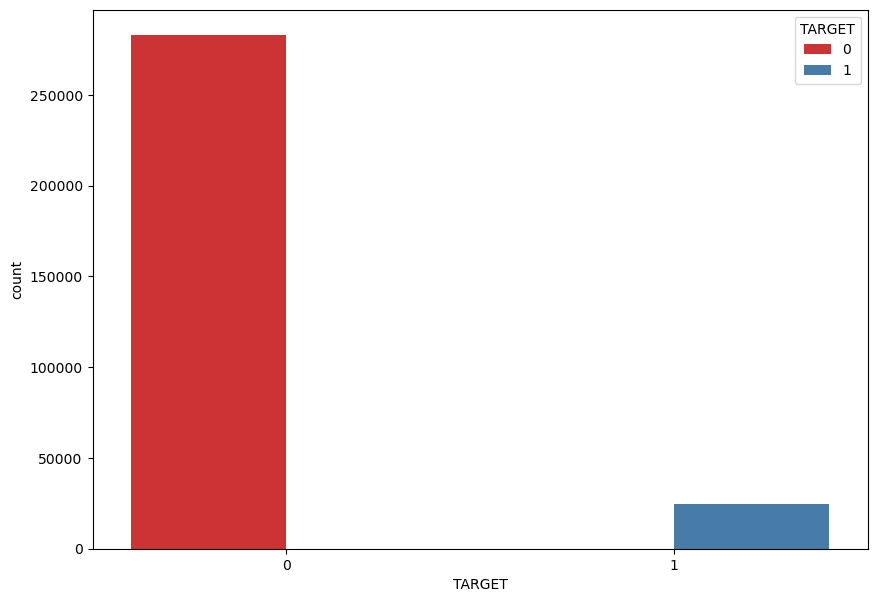

In [94]:
fig, ax = plt.subplots(figsize=(10,7))
sns.countplot(x ='TARGET',data=application_train, hue='TARGET',palette="Set1")

### Aligner les ensembles de données après un codage à chaud : 
### une jointure interne supprime les fonctions qui ne sont pas présentes dans l’un des ensembles

In [32]:
train_labels = application_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train_business, app_test_business = app_train_business.align(app_test_business, join = 'inner', axis = 1)

# Add the target back in
app_train_business['TARGET'] = train_labels

print('Training Features shape: ', app_train_business.shape)
print('Testing Features shape: ', app_test_business.shape)

Training Features shape:  (307511, 86)
Testing Features shape:  (307511, 86)


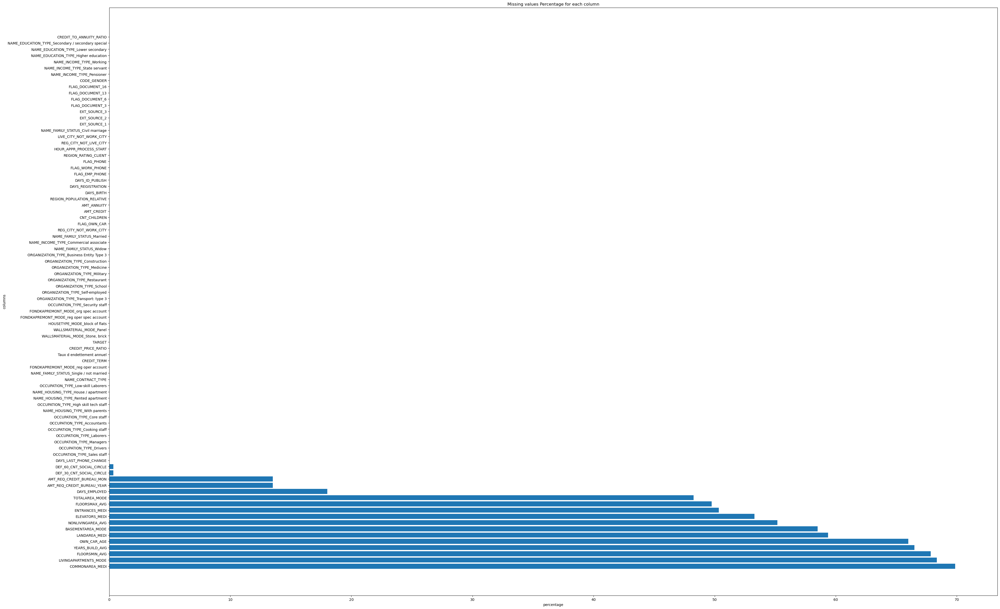

In [27]:
def PercentageMissingValues(df):
    plt.figure(figsize=(45,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(app_train_business)

In [33]:
def deleteByPercent(df,percentage):
    #les colonnes avec 100% des valeurs manquantes
    colomns_W_NAN = df.columns[df.isnull().any()]
    #shape methode permet de comptabiliser le nombre de lignes
    #et de colonnes sans comptabiliser la ligne d'en tete dans le nombre de ligne
    df_shape = df.shape
    for column in colomns_W_NAN:
        if df[column].isnull().sum()*100.0/df_shape[0] >= percentage:
            df.drop(column,1, inplace= True) 
deleteByPercent(app_train_business,80)  
app_train_business.head()


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,CNT_CHILDREN,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",TARGET,CREDIT_PRICE_RATIO,Taux d endettement annuel,CREDIT_TERM,CREDIT_TO_ANNUITY_RATIO
0,0,1,0,0,406597.5,24700.5,0.018801,26.0,1.745205,-3648.0,...,1,0,1,0,1,1,1.158397,0.121978,0.060749,16.461104
1,0,0,0,0,1293502.5,35698.5,0.003541,46.0,3.254795,-1186.0,...,1,0,1,0,0,0,1.145199,0.132217,0.027598,36.234085
2,1,1,1,0,135000.0,6750.0,0.010032,52.0,0.616438,-4260.0,...,0,0,0,0,0,0,1.000000,0.100000,0.050000,20.000000
3,0,0,0,0,312682.5,29686.5,0.008019,52.0,8.326027,-9833.0,...,0,0,0,0,0,0,1.052803,0.219900,0.094941,10.532818
4,0,1,0,0,513000.0,21865.5,0.028663,55.0,8.323288,-4311.0,...,0,0,0,0,0,0,1.000000,0.179963,0.042623,23.461618


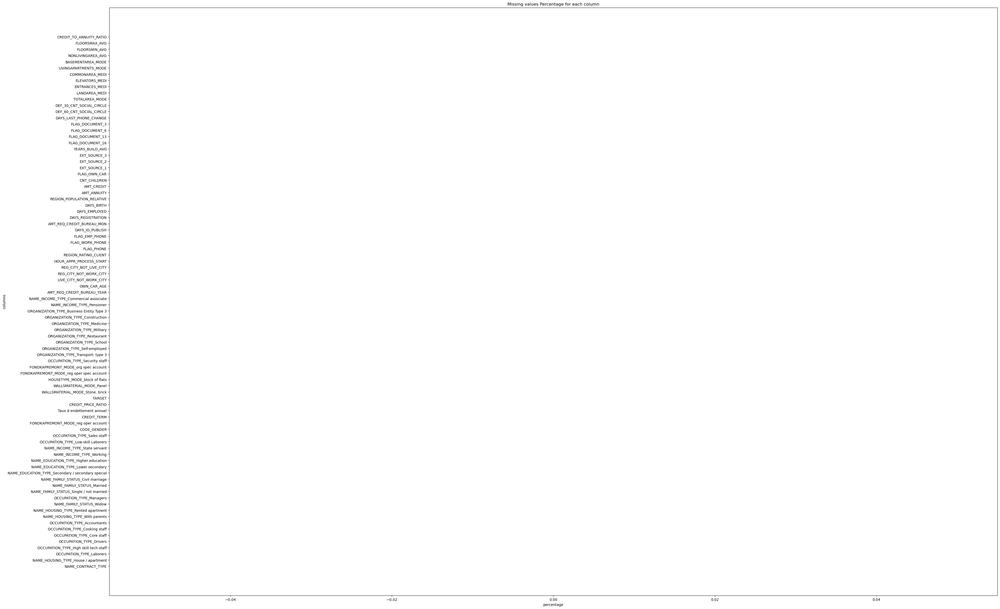

In [34]:
app_train_business.replace([np.inf, -np.inf], np.nan, inplace=True)
app_train_business = app_train_business.fillna(app_train_business.median())
def PercentageMissingValues(df):
    plt.figure(figsize=(45,30))
#Prepare the data
#Count and sort by the number of missing values.
    counts_series = df.isnull().mean(axis=0).apply(lambda x: x*100).sort_values(ascending=False)
#Set the title and other labels if need be
    plt.title("Missing values Percentage for each column")
    plt.ylabel("columns")
    plt.xlabel("percentage")
#the chart plot
    plt.barh(counts_series.index,counts_series.values)
    plt.show()
PercentageMissingValues(app_train_business)

# Step 4 Determine the characteristics of the model and train it !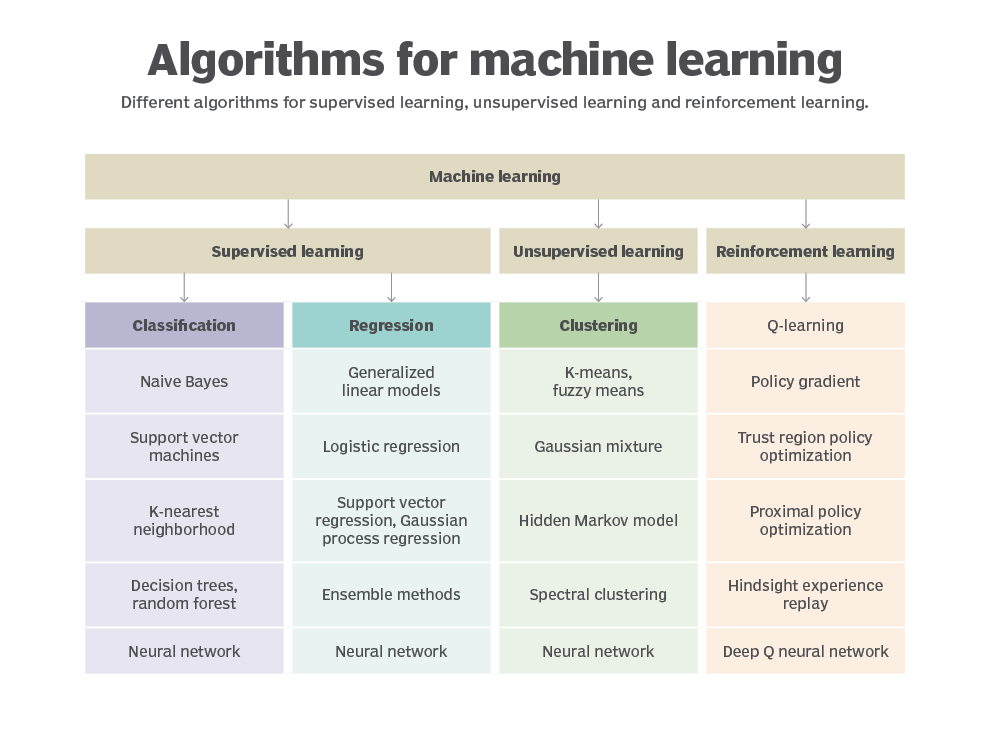

# Step 5. Assess model performance and establish benchmarks 

### Let's split the whole dataset into a training set (80% of data) and a test set (20% of data)
### The dataset will be split in a stratified way, in order to have a good distribution of the target variable

In [35]:
from sklearn.model_selection import train_test_split
# Given data
if 'TARGET' in app_train_business:
    X = app_train_business.drop(["TARGET"], axis=1)
else:
    X = app_train_businesscopy
    # Data to predict
y = app_train_business["TARGET"]

# Let's split the whole dataset into a training set (80% of data) and a test set (20% of data)
# The dataset will be split in a stratified way, in order to have a good distribution of the target variable
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Save the prepared  data
X_train.to_csv("Credit_to_spend/prepared/X_train.csv", index=False)
X_test.to_csv("Credit_to_spend/prepared/X_test.csv", index=False)
y_train.to_csv("Credit_to_spend/prepared/y_train.csv", index=False)
y_test.to_csv("Credit_to_spend/prepared/y_test.csv", index=False)


### Normalisation

#### La normalisation est une opération du pré-traitement de données qui a pour but de mettre sur une même échelle toutes les variables quantitatives. 
#### Supposons qu’on ait à comparer les variables taille et âge. Ces deux variables n’étant pas sur une même échelle de grandeur, la comparaison n’aura pas véritablement de sens. Une mise à échelle est nécessaire pour mettre nos variables sur la même échelle, c’est ce qui facilitera la comparaison et lui donnera du sens et ne faussera pas l'apprentissage

In [36]:
from sklearn.preprocessing import StandardScaler


if os.path.exists("Credit_to_spend/prepared/X_train_scaled.csv") and os.path.exists(
    "Credit_to_spend/prepared/X_test_scaled.csv"
):
    X_train = pd.read_csv("Credit_to_spend/prepared/X_train.csv")
    X_test = pd.read_csv("Credit_to_spend/prepared/X_test.csv")
else:
    # define scaler
    scaler = StandardScaler()

    # fit scaler on train data only, to avoid data leak
    X_train = pd.DataFrame(
        scaler.fit_transform(X_train),
        columns=X.columns,
    )
    X_test = pd.DataFrame(
        scaler.transform(X_test),
        columns=X.columns,
    )

    # Save the processed data
    X_train.to_csv("Credit_to_spend/prepared/X_train_scaled.csv", index=False)
    X_test.to_csv("Credit_to_spend/prepared/X_test_scaled.csv", index=False)
X_train.describe(include="all")

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,CNT_CHILDREN,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FONDKAPREMONT_MODE_org spec account,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",CREDIT_PRICE_RATIO,Taux d endettement annuel,CREDIT_TERM,CREDIT_TO_ANNUITY_RATIO
count,246008.000000,246008.000000,246008.000000,246008.000000,2.460080e+05,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,...,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000,246008.000000
mean,0.095314,0.341944,0.339806,0.416409,5.993382e+05,27106.987789,0.020858,43.918275,6.171918,-4989.585005,...,0.018272,0.240017,0.039340,0.489732,0.214847,0.210814,1.122983,0.180903,0.053650,21.624225
std,0.293649,0.474362,0.473644,0.719500,4.027258e+05,14521.637448,0.013835,11.961150,5.858143,3524.557231,...,0.133933,0.427094,0.194403,0.499896,0.410717,0.407888,0.123886,0.094576,0.022453,7.820382
min,0.000000,0.000000,0.000000,0.000000,4.500000e+04,0.000000,0.000290,21.000000,0.000000,-24672.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.150000,0.000000,0.000000,8.036674
25%,0.000000,0.000000,0.000000,0.000000,2.700000e+05,16506.000000,0.010006,34.000000,2.550685,-7480.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.114577,0.036897,15.647004
50%,0.000000,0.000000,0.000000,0.000000,5.147775e+05,24903.000000,0.018850,43.000000,4.515068,-4505.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.118800,0.162833,0.050000,20.000000
75%,0.000000,1.000000,1.000000,1.000000,8.086500e+05,34596.000000,0.028663,54.000000,7.567123,-2015.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.198000,0.229000,0.063910,27.099985
max,1.000000,1.000000,1.000000,19.000000,4.050000e+06,258025.500000,0.072508,69.000000,49.073973,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,1.570600,0.124430,45.305079


### Pourquoi utiliser Fbeta score?

#### Fbeta-measure est une métrique configurable à score unique pour évaluer un modèle de classification binaire basé sur les prédictions faites pour la classe positive.
#### La mesure Fbeta est calculée en utilisant la précision et le rappel.
#### Fbeta-measure fournit une version configurable de la mesure F pour accorder 
#### La mesure Fbeta est une généralisation de la mesure F qui ajoute un paramèt re
#### de configuration appelé b êta. Une valeur bêta par défaut est 1,0, 
#### ce qui est identique à la mesure F. Une valeur bêt us petite, telle que 0,5, 
#### donne plus de poids à la précision et moins au rap   # 
#### tandis qu’une valeur bêta plus grande, telle que 2,0, donne moins de poids à la précision 
#### et plus de poids au rappel dans le calcul du score.


#### Dans notre cas la maximisation du rappel est preferable d'ou le choix d beta a 2 
#### ce qui minimisera les erreurs faussement négatives.

In [37]:
from sklearn.metrics import precision_score, recall_score, f1_score, fbeta_score, average_precision_score
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import classification_report
def get_f2scores(y_test, preds, sample_weights=None):
    #print(f'Recall score : {recall_score(y_test, preds, sample_weight=sample_weights)}')
    print(f'F2 score : {fbeta_score(y_test, preds, sample_weight=sample_weights, beta=2)}')
   # print('\n')
   # print(classification_report(y_test, preds, sample_weight=sample_weights))

In [38]:
def get_heatmap(y_test,preds, sample_weights=None):
    cm = confusion_matrix(y_test, preds, sample_weight=sample_weights)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm/np.sum(cm), annot=True,
            fmt='.2%', cmap='Blues')

In [39]:
from sklearn.metrics import make_scorer,fbeta_score
def f2_func(y_test, y_pred):
    f2_score = fbeta_score(y_true, y_pred, beta=2)
    return f2_score


def f2_scorer():
    return make_scorer(f2_func)


In [40]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
def modelsEvaluation(y_pred,y_test):
    
    
    a = accuracy_score(y_te,y_pre)
    f = f1_score(y_te, y_pre, average="macro")
    p = precision_score(y_te, y_pre, average="macro")
    r = recall_score(y_te, y_pre, average="macro")
    print("accuracy score : ",a)
    print("f1 score : ",f)
    print("precision score : ",p)
    print("recall score : ",r)
    print("")
    # Computing Confusion matrix for the above algorithm

    cnf_matrix = confusion_matrix(y_te, y_pre)
    # Data test results
    print('Evaluation of predictions: \n')
    print(f'Accuracy = {accuracy_score(y_test,y_pred):.2f}\nRecall = {recall_score(y_test, preds):.2f}\n')
    print("Area ROC: %.2f%%" % (roc * 100.0))
    print("F2 Score: %.2f%%" % (f2 * 100.0))

## Re equilibrage de donnée

### Cette technique évite le surajustement qui se produit dans notre modèle lorsque des observations en double de classes minoritaires sont ajoutées à l’ensemble de données principal (dans la technique de rééchantillonnage)

In [41]:
from imblearn.over_sampling import SMOTE 

sm = SMOTE(random_state=42)

X_sm, y_sm = sm.fit_resample(X, y)

print(f'''Shape of X before SMOTE: {X.shape}
Shape of X after SMOTE: {X_sm.shape}''')

print('\nBalance of positive and negative classes (%):')
y_sm.value_counts(normalize=True) * 100

Shape of X before SMOTE: (307511, 85)
Shape of X after SMOTE: (565372, 85)

Balance of positive and negative classes (%):


1    50.0
0    50.0
Name: TARGET, dtype: float64

## La Cross Validation 

#### Est un moyen d’assurer que notre modèle de Machine Learning est au maximum de ses capacités
#### Il y a seulement 4 étapes pour réaliser une Cross Validation :

#### 1 créer 5 sous-groupes de notre dataset
#### 2 entraîner un modèle sur 4 sous-groupes
#### 3 évaluer le modèle sur le dernier sous-groupes
#### 4répéter les étapes 2 et 3 pour que tous les sous-groupes soient évalués

## Grid Search CV

#### GridSearchCV est un outil utile pour affiner les paramètres de notre modèle. Selon l’estimateur utilisé 

# GaussienNB

#### Gaussien NB Hyperparametres
###### var_smoothing est un calcul de stabilité permettant d’élargir (ou de lisser) la courbe et donc de tenir compte d’un plus grand nombre d’échantillons plus éloignés de la moyenne de distribution. Dans ce cas, np.logspace renvoie des nombres espacés uniformément sur une échelle logarithmique, commence à 0, se termine à -9 et génère 100 échantillons.

#### Fontion permettant de modeliser sa propre metrique selon les exigences metier non utilisée dans ce cas mais que j'ai etudié en parallele

In [ ]:
ftwo_scorer = make_scorer(fbeta_score, beta=2)

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, r2_score,fbeta_score
from sklearn.model_selection import cross_validate
from sklearn.metrics import mean_squared_error
from imblearn.pipeline import Pipeline
from sklearn.model_selection import KFold, LeaveOneOut, ShuffleSplit
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score

pipeline = Pipeline(steps = [['smote',SMOTE()],
                         
                            ['GNB_model', GaussianNB()]])
GNB_grid_param = {
    'GNB_model__var_smoothing': np.logspace(0,-9, num=100)
                }
cv = KFold(n_splits=5, random_state=None)
GNB_grid = GridSearchCV(estimator=pipeline,param_grid = GNB_grid_param,scoring = ftwo_scorer cv= cv)
GNB_grid.fit(X_train,y_train)
print('finish')
pipeline




In [108]:
GNB_model = GNB_grid.best_estimator_

In [109]:
GNB_y_pred =GNB_model.predict(X_test)
score = GNB_grid.best_score_
score

0.4690335268000931

In [110]:
GNB_f2score =get_f2scores(y_test, GNB_y_pred, sample_weights=None)

F2 score : 0.31390835678678514


In [111]:
GNB_f2score = ftwo_scorer
GNB_f2score 

make_scorer(f2_func)

In [112]:
GNB_Params = GNB_grid.best_params_
GNB_Params

{'GNB_model__var_smoothing': 8.111308307896873e-08}

In [113]:
GNB_model = GNB_grid.best_estimator_
GNB_model.score(X_test,y_test)

0.4692616620327464

In [114]:
confusion_matrix(y_test,GNB_model.predict(X_test))

array([[25448, 31090],
       [ 1552,  3413]], dtype=int64)

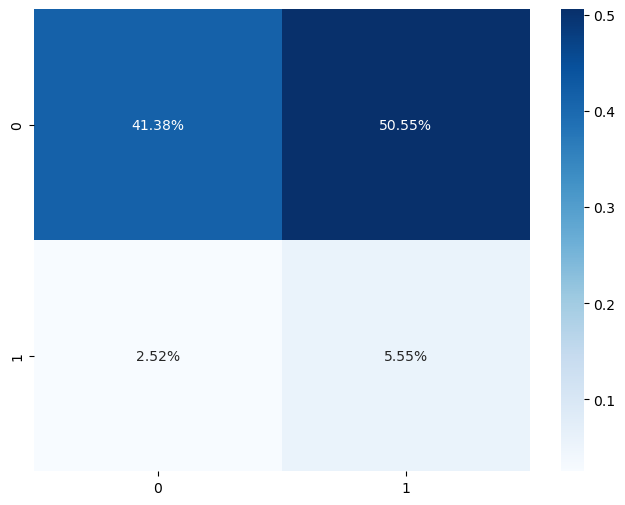

In [115]:
get_heatmap(y_test,GNB_model.predict(X_test), sample_weights=None)

In [116]:
F2score = get_f2scores(y_test, GNB_model.predict(X_test), sample_weights=None)

F2 score : 0.31390835678678514


In [117]:
print('Evaluation of predictions: \n')
a1 = accuracy_score(y_test,GNB_model.predict(X_test))
GNB_f2score =get_f2scores(y_test, GNB_y_pred, sample_weights=None)

p1 = precision_score(y_test, GNB_model.predict(X_test), average="macro")
r1 = recall_score(y_test, GNB_model.predict(X_test), average="macro")
GNB_matrix = confusion_matrix(y_test, GNB_model.predict(X_test))
GBN_Best_Score = score
GBN_Best_Param = GNB_grid.best_params_
#c2 = GNB_model.grid.best_score_

np.set_printoptions(precision=2)
print("Cross Validation score : ",GBN_Best_Score)
print("Grid Search parameters result : ",GBN_Best_Param)
print("accuracy score : ",a1)
print("f2score : ",GNB_f2score)
print("precision score : ",p1)
print("recall score : ",r1)
print("matrix :  ",GNB_matrix)    

Evaluation of predictions: 

F2 score : 0.31390835678678514
Cross Validation score :  0.4690335268000931
Grid Search parameters result :  {'GNB_model__var_smoothing': 8.111308307896873e-08}
accuracy score :  0.4692616620327464
f2score :  None
precision score :  0.5207187265519585
recall score :  0.5687581188878235
matrix :   [[25448 31090]
 [ 1552  3413]]


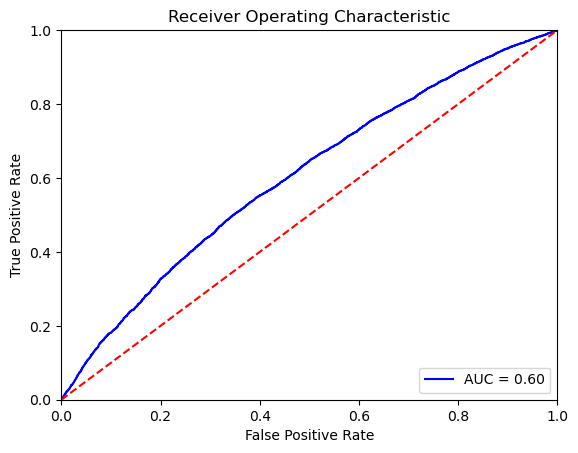

C:\Users\nadia\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


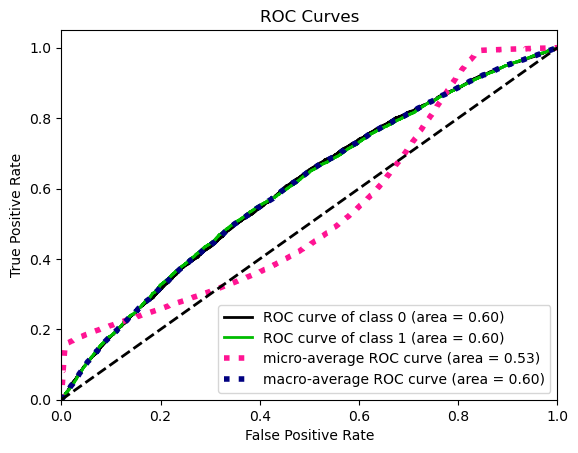

In [118]:
import sklearn.metrics as metrics
import scikitplot as skplt
probs = GNB_model.predict_proba(X_test)
GNB_pred = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, GNB_pred)
roc_auc = metrics.auc(fpr, tpr)


plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


df = pd.DataFrame(dict(fpr = fpr, tpr = tpr))
#y_true = # ground truth labels
#y_probas = # predicted probabilities generated by sklearn classifier
skplt.metrics.plot_roc_curve(y_test, probs)
plt.show()

In [119]:
# import Explainer function from lime_tabular module of lime library
import lime
import random
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['bad candidate', 'good candidate'],
    mode='classification'
)
exp = explainer.explain_instance(
    data_row=X_test.iloc[1], 
    predict_fn=GNB_model.predict_proba
)

exp.show_in_notebook(show_table=True)

C:\Users\nadia\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


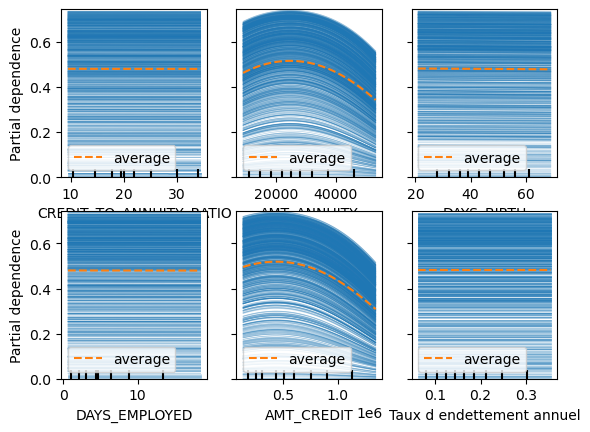

In [120]:
from sklearn.inspection import PartialDependenceDisplay
features =["CREDIT_TO_ANNUITY_RATIO",
           "AMT_ANNUITY",
            "DAYS_BIRTH",
            "DAYS_EMPLOYED",
            "AMT_CREDIT",
            "Taux d endettement annuel",
           ]


PartialDependenceDisplay.from_estimator(GNB_model, X, features,
  kind='both')


In [121]:
from sklearn.model_selection import learning_curve, GridSearchCV
N, train_score, val_score = learning_curve(GNB_model,X_train,y_train,
                                           train_sizes =np.linspace(0.1,1.0,15),cv=5)
print(N)


[ 19680  32332  44984  57636  70287  82939  95591 108243 120895 133546
 146198 158850 171502 184154 196806]


In [122]:
def display_feat_imp(model):
    feature_imp = model.get_booster().get_score(importance_type='weight')
    keys = list(feature_imp.keys())
    values = list(feature_imp.values())
    data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
    data.nlargest(40, columns="score").plot(kind='barh', figsize = (20,12)) 


# XGBoost model & Grid Search CV

In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import xgboost as xgb

XGB_pipeline = Pipeline(steps = [['smote',SMOTE()],
                            #['scaler',MinMaxScaler()],
                            ['XGB_Model', XGBClassifier()]])

cv = KFold(n_splits=5, random_state=None)

XGB_grid_param = {
            'XGB_Model__max_depth': [1, 2, 4, 8],
            'XGB_Model__learning_rate': [0.05, 0.06, 0.07],
            'XGB_Model__n_estimators': [10, 50, 100]
          }
XGB_grid = GridSearchCV(estimator=XGB_pipeline,param_grid = XGB_grid_param, scoring = ftwo_scorer ,cv=cv)
XGB_grid.fit(X_train, y_train)
print('finish')

XGB_pipeline

In [124]:
XGB_Model = XGB_grid.best_estimator_


In [125]:
XGB_y_pred = XGB_Model.predict(X_test)

In [126]:
XGB_f2score =get_f2scores(y_test, XGB_y_pred, sample_weights=None)


F2 score : 0.3243013465704962


In [127]:
XGB_grid.best_score_

0.3221213827661997

In [128]:
XGB_grid.best_params_

{'XGB_Model__learning_rate': 0.05,
 'XGB_Model__max_depth': 1,
 'XGB_Model__n_estimators': 50}

In [129]:
XGB_Model.score(X_test,y_test)

0.7262247370046989

In [130]:
confusion_matrix(y_test,XGB_Model.predict(X_test))

array([[42300, 14238],
       [ 2600,  2365]], dtype=int64)

In [131]:
N, train_score, val_score = learning_curve(XGB_Model,X_train,y_train,
                                           train_sizes =np.linspace(0.1,1.0,10),cv=5)
print(N)


[ 19680  39361  59041  78722  98403 118083 137764 157444 177125 196806]


### Jeu de donnée de validation plus facile a predire que l'ensemble de données d'entrainement

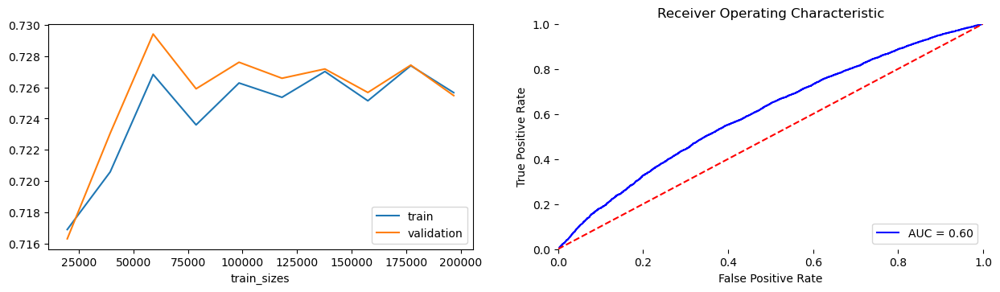

In [132]:
plt.figure(figsize=(15,8))
plt.subplot(221)
plt.plot(N,train_score.mean(axis=1),label='train')
plt.plot(N,val_score.mean(axis=1),label='validation')
plt.xlabel('train_sizes')
plt.legend()
# equivalent but more general
ax1 = plt.subplot(2, 2, 1)

# add a subplot with no frame
ax2 = plt.subplot(222, frameon=False)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
# add a polar subplot



#### La courbe ROC (Receiver Operator Characteristic) est une mesure d’évaluation des problèmes de classification binaire. Il s’agit d’une courbe de probabilité qui trace le TPR par rapport au FPR à différentes valeurs seuils et sépare essentiellement le « signal » du « bruit ». L’aire sous la courbe (AUC) est la mesure de la capacité d’un classificateur à distinguer les classes et est utilisée comme résumé de la courbe ROC.

#### Plus l’ASC est élevée, meilleures sont les performances du modèle pour distinguer les classes positives et négatives.

Evaluation of predictions: 

Cross Validation score :  0.3221213827661997
Grid Search parameters result :  {'XGB_Model__learning_rate': 0.05, 'XGB_Model__max_depth': 1, 'XGB_Model__n_estimators': 50}
accuracy score :  0.7262247370046989
f2 score :  0.017519271198318153
precision score :  0.5422688389022458
recall score :  0.6122518565969427
matrix :  [[42300 14238]
 [ 2600  2365]]


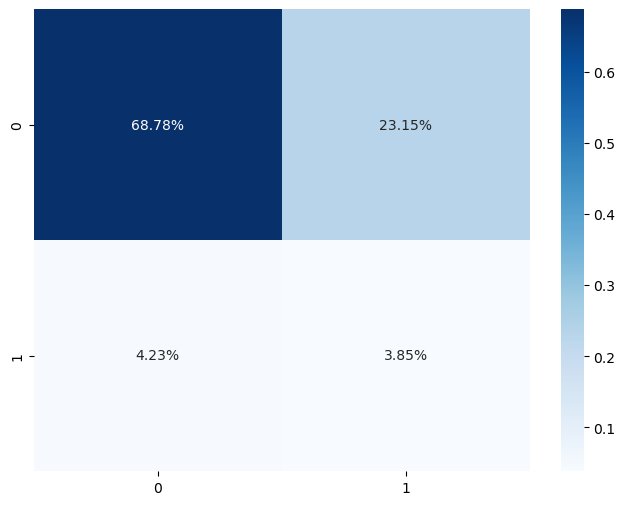

In [133]:
xbg_pred = XGB_Model.predict(X_test)
print('Evaluation of predictions: \n')
a2 = accuracy_score(y_test,xbg_pred)
XGB_F2score = 0.017519271198318153
p2 = precision_score(y_test, xbg_pred, average="macro")
r2 = recall_score(y_test, xbg_pred, average="macro")
XGB_Best_Score = XGB_grid.best_score_
XGB_Best_Param = XGB_grid.best_params_
XGB_matrix = confusion_matrix(y_test, xbg_pred)

np.set_printoptions(precision=2)
print("Cross Validation score : ",XGB_Best_Score)
print("Grid Search parameters result : ",XGB_Best_Param)
print("accuracy score : ",a2)
print("f2 score : ",XGB_F2score)
print("precision score : ",p2)
print("recall score : ",r2)
print("matrix : ",XGB_matrix)
get_heatmap(y_test,xbg_pred, sample_weights=None)

In [134]:
XGB_model_fitted = XGB_grid.best_estimator_[1]
print(XGB_model_fitted)  # RandomForestClassifier()

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=1, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=50, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)


In [135]:
import shap
shap.initjs()
feature_importance = X_test
explainer = shap.TreeExplainer(XGB_model_fitted)
shap_values = explainer.shap_values(feature_importance)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


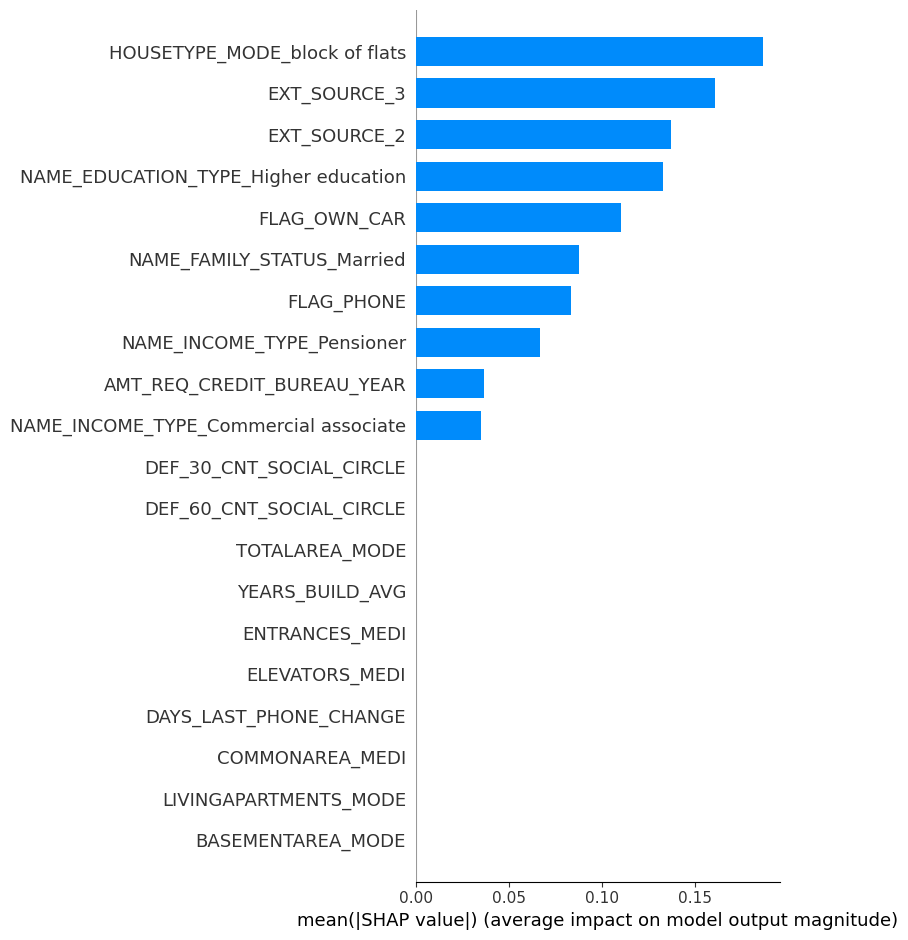

In [137]:
#On trace l'importance des variables de notre modèle
fig = shap.summary_plot(shap_values, feature_importance, plot_type="bar")


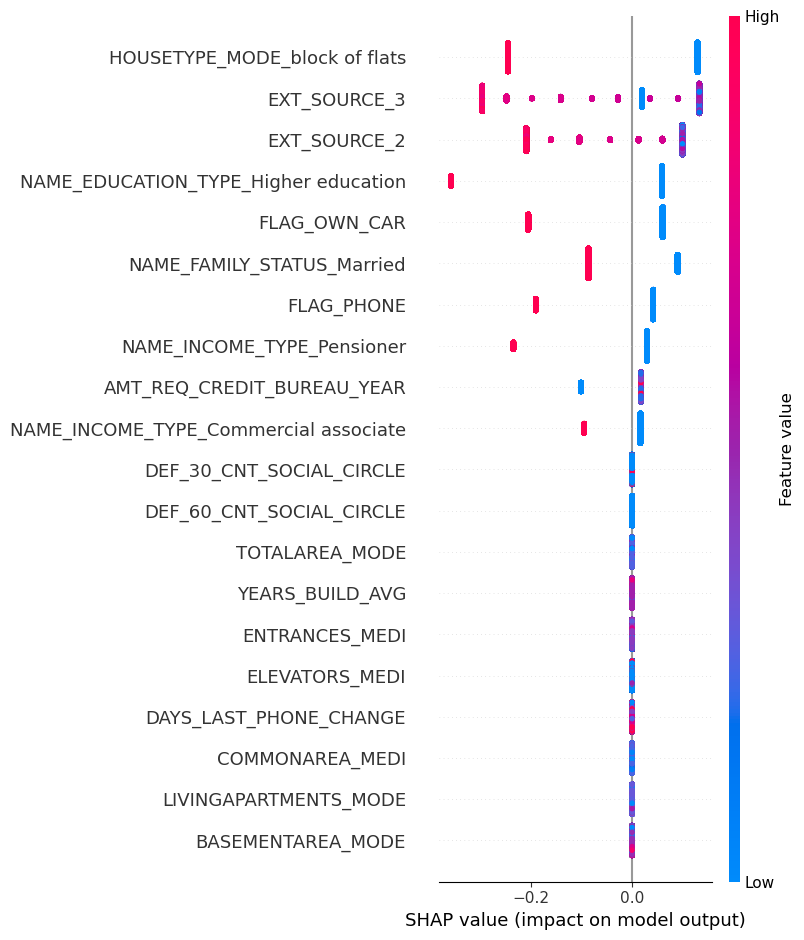

In [138]:
#On affiche l'ensemble des clients en fonction de l'importance de nos variables
shap.summary_plot(shap_values, feature_importance)

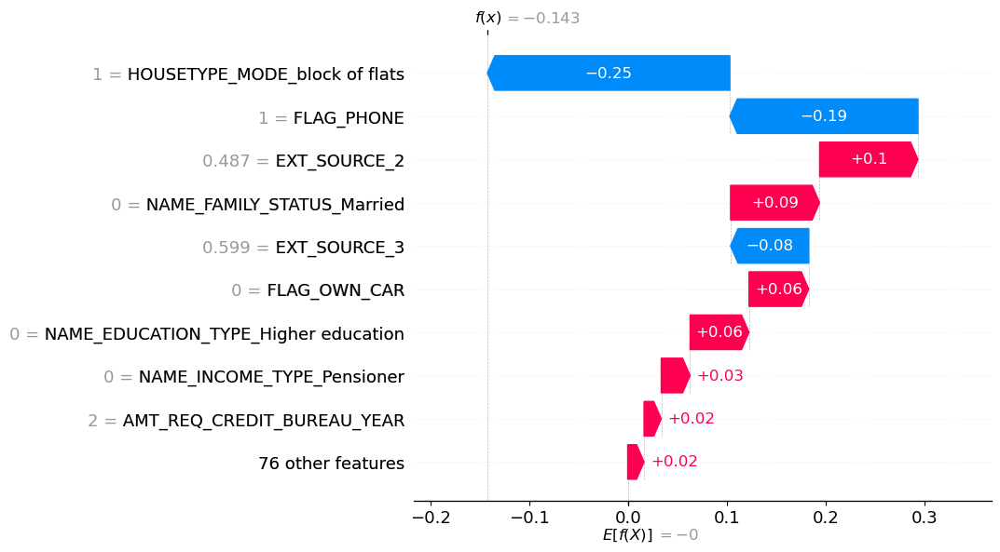

In [139]:
#On trace le waterfall d'un client eligible
shap.waterfall_plot(shap.Explanation(values=shap_values[2,:],
                                     base_values=explainer.expected_value,
                                     data=X_train.iloc[2,:],
                                     feature_names=X_train.columns.tolist()),max_display=10)

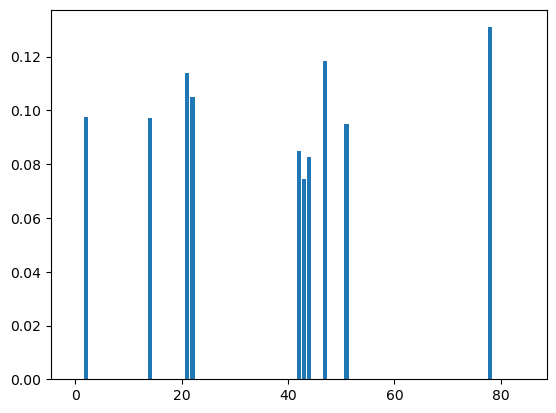

In [140]:
plt.bar(range(len(XGB_model_fitted.feature_importances_)), XGB_model_fitted.feature_importances_)
plt.show()

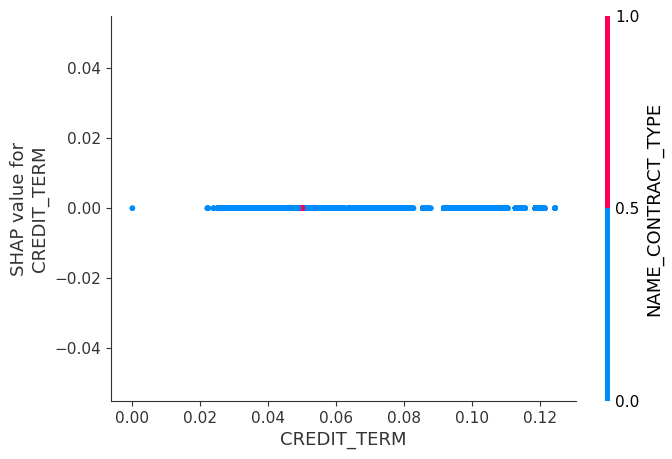

In [141]:
shap.dependence_plot("CREDIT_TERM", shap_values, feature_importance)


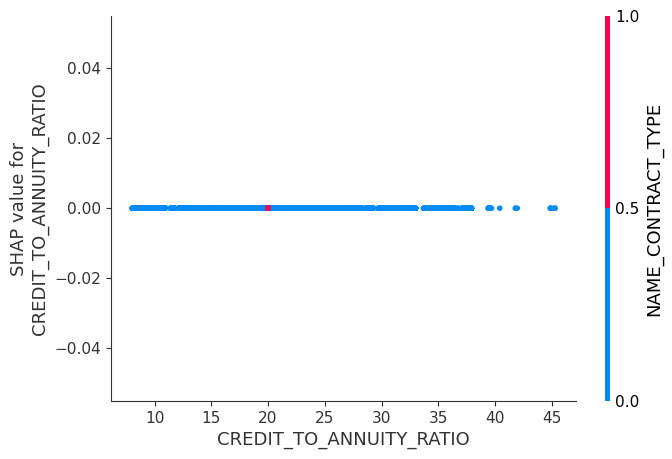

In [142]:
shap.dependence_plot("CREDIT_TO_ANNUITY_RATIO", shap_values, feature_importance)

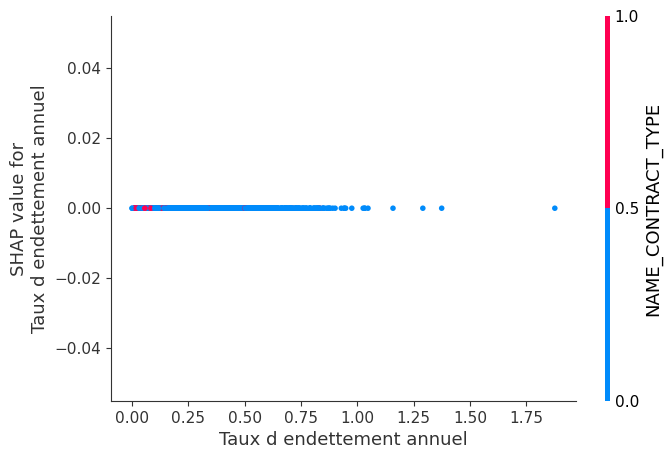

In [143]:
shap.dependence_plot("Taux d endettement annuel", shap_values, feature_importance)

In [144]:
def display_feat_imp(model):
  feature_imp = XGB_Model.get_booster().get_score(importance_type='weight')
  keys = list(feature_imp.keys())
  values = list(feature_imp.values())
  data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
  data.nlargest(40, columns="score").plot(kind='barh', figsize = (18,10)) 
 



###  L'emsemble de nos fonctionnalités ont joué un role determinant 

In [145]:
X_interaction = feature_importance.iloc[:500,:]

shap_interaction_values = shap.TreeExplainer(XGB_model_fitted).shap_interaction_values(X_interaction)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


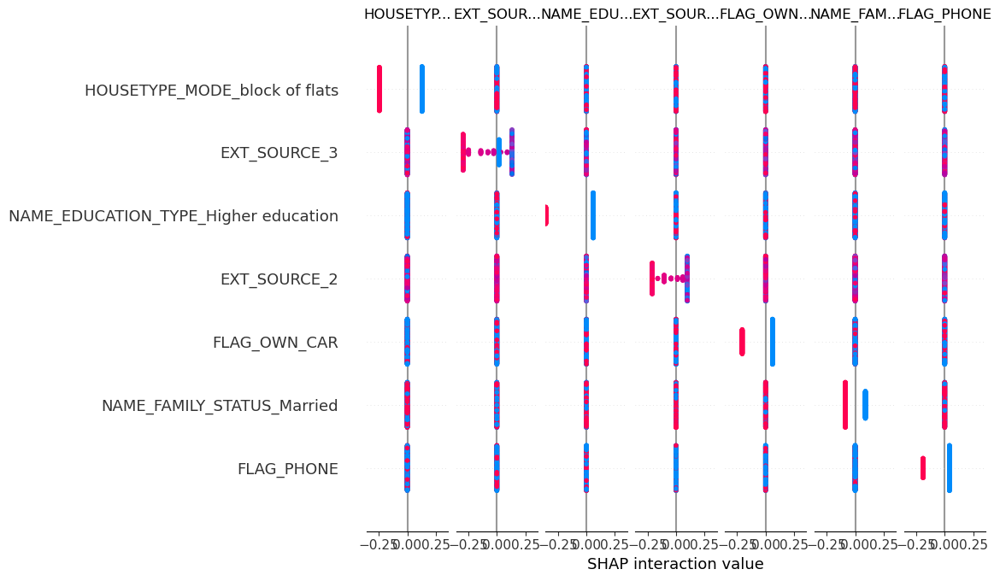

In [146]:
shap.summary_plot(shap_interaction_values, X_interaction)

In [147]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['bad candidate', 'good candidate'],
    mode='classification'
)
exp = explainer.explain_instance(
    data_row=X_test.iloc[1], 
    predict_fn=XGB_Model.predict_proba
)

exp.show_in_notebook(show_table=True)

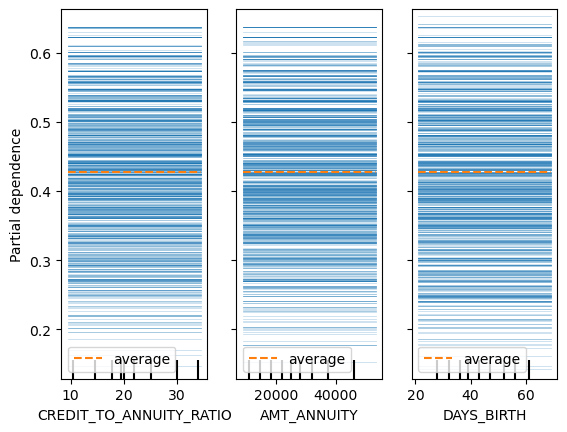

In [148]:
from sklearn.inspection import PartialDependenceDisplay


features =["CREDIT_TO_ANNUITY_RATIO",
           "AMT_ANNUITY",
            "DAYS_BIRTH",
           
           ]


PartialDependenceDisplay.from_estimator(XGB_Model, X, features,
  kind='both')


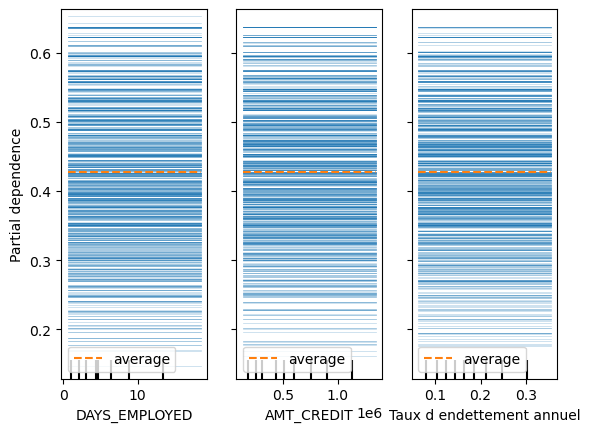

In [149]:
feature =[ "DAYS_EMPLOYED",
            "AMT_CREDIT",
            "Taux d endettement annuel",
           ]
PartialDependenceDisplay.from_estimator(XGB_Model, X, feature,
  kind='both')        

# KNN  MODEL

In [42]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from imblearn.pipeline import Pipeline
from sklearn.model_selection import KFold, LeaveOneOut, ShuffleSplit
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.model_selection import ParameterGrid

ftwo_scorer = make_scorer(fbeta_score, beta=2)
KNN_Model = KNeighborsClassifier()

KNN_pipeline = Pipeline(steps = [['smote',SMOTE()],
                               ['KNN_Model', KNeighborsClassifier()]])

cv = KFold(n_splits=5, random_state=None)

KNN_grid_param = {'KNN_Model__n_neighbors' : np.arange(1,10),
                 'KNN_Model__metric' : ['euclidean','manhattan']}
KNN_grid = GridSearchCV(estimator=KNN_pipeline,param_grid = KNN_grid_param,scoring = ftwo_scorer,cv=cv)
KNN_grid.fit(X_train, y_train)
print('finish')

KNN_pipeline

finish


Pipeline(steps=[['smote', SMOTE()], ['KNN_Model', KNeighborsClassifier()]])

In [45]:
KNN_y_pred =KNN_grid.predict(X_test)

##### KNN_f2score =get_f2scores(y_test, KNN_y_pred, sample_weights=None)

In [46]:
KNN_grid.best_score_

0.26390364822779855

In [47]:
ftwo_scorer 

make_scorer(fbeta_score, beta=2)

In [48]:
KNN_f2score =get_f2scores(y_test, KNN_y_pred, sample_weights=None)

F2 score : 0.27180582143032445


In [49]:
KNN_grid.best_params_

{'KNN_Model__metric': 'euclidean', 'KNN_Model__n_neighbors': 9}

In [50]:
KNN_Model = KNN_grid.best_estimator_


In [ ]:
KNN_N, train_score, val_score = learning_curve(KNN_Model,X_train,y_train,
                                           train_sizes =np.linspace(0.1,1.0,10),cv=5)
print(KNN_N)

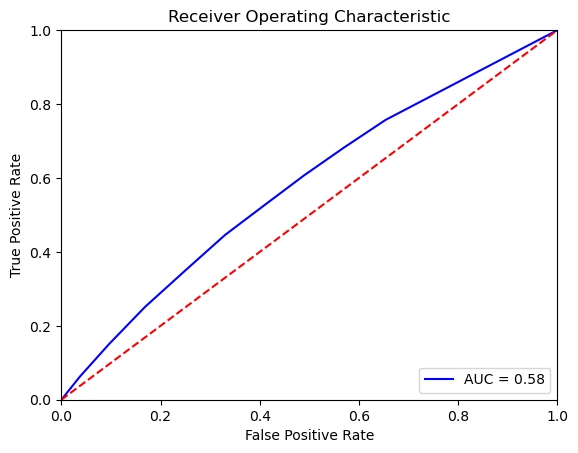

C:\Users\nadia\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


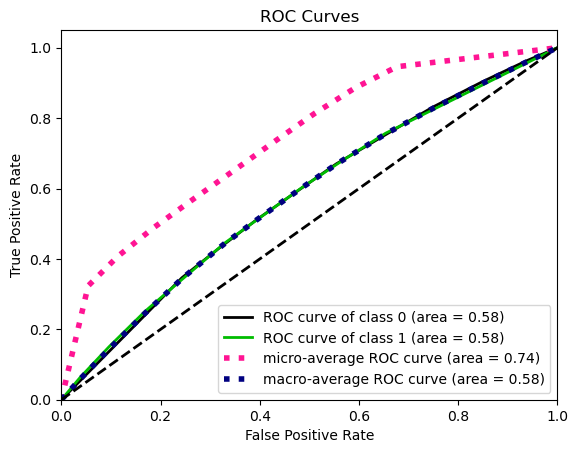

In [52]:
import sklearn.metrics as metrics
import scikitplot as skplt
probs = KNN_Model.predict_proba(X_test)
pred = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, pred)
roc_auc = metrics.auc(fpr, tpr)


plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


df = pd.DataFrame(dict(fpr = fpr, tpr = tpr))
#y_true = # ground truth labels
#y_probas = # predicted probabilities generated by sklearn classifier
skplt.metrics.plot_roc_curve(y_test, probs)
plt.show()

In [53]:
print('Evaluation of predictions: \n')
KNN_preds = KNN_Model.predict(X_test)
a3 = accuracy_score(y_test,KNN_preds)
KNN_f2score = 
 
p3 = precision_score(y_test, KNN_preds, average="macro")
r3 = recall_score(y_test, KNN_preds, average="macro")
KNN_matrix = confusion_matrix(y_test, KNN_preds)
KNN_Best_Param = KNN_grid.best_params_
KNN_Best_score = KNN_grid.best_score_
np.set_printoptions(precision=2)
print("Best Parametres : ",KNN_Best_Param)
print("Best Score : ",KNN_Best_score)
print("accuracy score : ",a3)
print("f2 score : ",KNN_f2score)
print("precision score : ",p3)
print("recall score : ",r3)
print("Confusion matrix : ",KNN_matrix)
#get_heatmap(y_test,RFC_pred = KNN_Model.predict(X_test),KNN_preds, sample_weights=None)

Evaluation of predictions: 

Best Parametres :  {'KNN_Model__metric': 'euclidean', 'KNN_Model__n_neighbors': 9}
Best Score :  0.26390364822779855
accuracy score :  0.6517080467619466
f2 score :  0.005765567030983657
precision score :  0.5191731301497158
recall score :  0.5579423950247508
Confusion matrix :  [[37867 18671]
 [ 2750  2215]]


In [55]:
accuracy = accuracy_score(y_test, )
print('Accuracy: {:.2f}'.format(accuracy))

Accuracy: 0.65


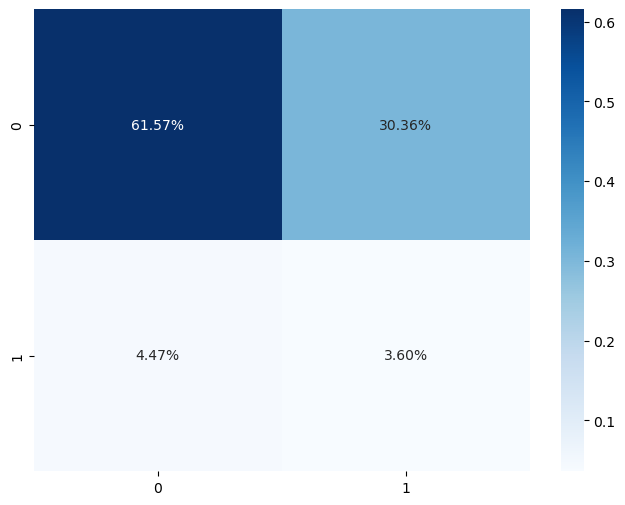

In [56]:
get_heatmap(y_test,KNN_y_pred, sample_weights=None)

### Random Forest Classifier model & Grid Search CV

In [ ]:
import shap
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix
ftwo_scorer = make_scorer(fbeta_score, beta=2)
KNN_Model = KNeighborsClassifier()

RFC_pipeline = Pipeline(steps = [['smote',SMOTE()],
                               ['FRC_Model', RandomForestClassifier(random_state=2)]])

cv = KFold(n_splits=5, random_state=None)

RFC_grid_param = {'RFC_Model__'max_depth': (3,5, 7, 10,None),
                 'RFC_Model__'n_estimators':(3,5,10,25,50,150),
                  'RFC_Model__'max_features': (4,7,15,20)}
RFC_grid = GridSearchCV(estimator=RFC_pipeline,param_grid = KNN_grid_param,scoring = ftwo_scorer,cv=cv)
RFC_grid.fit(X_train, y_train)
print('finish')

RFC_pipeline


RFC_pred = RFC_model.predict(X_test)
print(grid_search.best_score_)
print(grid_search.best_params_)
print(f'Accuracy = {accuracy_score(y_test, RFC_pred):.2f}\nRecall = {recall_score(y_test, RFC_pred):.2f}\n')


In [ ]:
RFC_y_pred =RFC_Model.predict(X_test)

In [ ]:
RFC_f2score =get_f2scores(y_test, RFC_y_pred, sample_weights=None)

In [ ]:
RFC_model = grid.best_estimator_
RFC_model.score(X_test,y_test)

In [ ]:
RFC_score = grid.best_score_
print(RFC_score)


In [ ]:
RFC_params =  grid_search.best_params_
print(RFC_params)

In [ ]:
RFC_N, train_score, val_score = learning_curve(RFC_model,X_train,y_train,
                                           train_sizes =np.linspace(0.1,1.0,1),cv=5)
print(RFC_N)
print("finish")

In [ ]:
print('Evaluation of predictions: \n')
a4 = accuracy_score(y_test,RFC_pred)

RFC_f2score =0.0010065425264217413
p4 = precision_score(y_test, RFC_pred, average="macro")
r4 = recall_score(y_test, RFC_pred, average="macro")
RFC_matrix4 = confusion_matrix(y_test, RFC_pred)
np.set_printoptions(precision=2)
RFC_best_param = grid_search.best_params_
RFC_Best_Score = grid_search.best_score_
print("best param : ",RFC_best_param)
print("Best_Score : ",RFC_Best_Score)
print("accuracy score : ",a4)
print("f2 score : ",RFC_f2score)
print("precision score : ",p4)
print("recall score : ",r4)
#get_heatmap(y_test,RFC_pred = xgb_Model.predict(X_test),RFC_pred, sample_weights=None)

In [ ]:
plt.plot(N,train_score.mean(axis=1),label='train')
plt.plot(N,val_score.mean(axis=1),label='validation')
plt.xlabel('train_sizes')
plt.legend()

In [ ]:
probs = RFC_model.predict_proba(X_test)
RFCpred = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, RFCpred)
roc_auc = metrics.auc(fpr, tpr)


plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


df = pd.DataFrame(dict(fpr = fpr, tpr = tpr))
#y_true = # ground truth labels
#y_probas = # predicted probabilities generated by sklearn classifier
skplt.metrics.plot_roc_curve(y_test, probs)
plt.show()

In [ ]:
get_heatmap(y_test,RFC_y_pred, sample_weights=None)

In [ ]:
#On affiche l'ensemble des clients en fonction de l'importance de nos variables
shap.summary_plot(shap_values, X_test)

In [ ]:
display_feat_imp(RFC_model)

In [ ]:
print('Training data shape: ', X_train.shape)
print('Testing data shape: ', X_test.shape)

In [ ]:
#On recupère le score et la valeur binaire definissant si le client est eligible ou non
target = xgb_Model.predict(X_test.iloc[:,1:])
score = [round(i,2) for i in xgb_Model.predict_proba(X_test.iloc[:,1:])[:, 1]]

In [ ]:
from pandas import DataFrame as df
xgb_preds = xgb_Model.predict(X_test)
xgb_preds = pd.DataFrame(xgb_preds)
df_out = X_test.reset_index()
df_out["Target"] = y_test.reset_index()["TARGET"]
df_out["score"] = xgb_preds.reset_index()[0]
y_test['xgb_pred'] = score

df_out = pd.merge(app_train_business,y_test[['xgb_pred']],how = 'left',left_index = True, right_index = True)
candidate = df(data=df_out)
candidate

In [ ]:

models = pd.DataFrame({
    'Models': ['GaussienNB','XGBoost','KNN ','Random Forest Classifier'],
    'Best Hyperparametre' : [ 'np.logspace(0,-9, num=100)','learning_rate: 0.06 max_depth: 8 n_estimators: 100','metric: euclidean n_neighbors: 8','max_depth: None max_features 20 n_estimators=  3'],
    'Cross Validation Score': [GBN_Best_Score,XGB_Best_Score,KNN_Best_score,RFC_Best_Score],
    'AUC Score': [a1,a2,a3,a4],
    'FBeta Score' : [GNB_f2score,XGB_F2score,KNN_f2score,RFC_F2score],
    'Test Score' : [r1,r2,r3,r4],
    'Recall Score' : [p1,p2,p3,p4],
    'Precision Score' : [p1,p2,p3,p4],
    'matrix' : [GNB_matrix,XGB_matrix,KNN_matrix,RFC_matrix4]
})

In [ ]:
pd.pivot_table(models,index = ["Best Hyperparametre","Models"])

In [ ]:
#import pickle
#with open("candidates1.pkl", 'wb') as file:  
#    pickle.dump(candidate, file)

In [ ]:
##Best model chosen 
#with open("modele_XGBoost.pkl", 'wb') as file:  
    #pickle.dump(xgb_Model, file)